In [1]:
import zipfile
import os
import pandas as pd
import numpy as np
from glob import glob
path = os.getcwd()
os.getcwd()

import os
import pandas as pd
import numpy as np
path = os.getcwd()
os.getcwd()

import geopandas as gpd # GeoPandas(지오판다스)
from glob import glob
import matplotlib.pyplot as plt
from shapely.geometry import Polygon, LineString, Point
import matplotlib

import rasterio
import matplotlib.pyplot as plt

import os
import pandas as pd
import numpy as np
path = os.getcwd()
os.getcwd()

import geopandas as gpd # GeoPandas(지오판다스)
from glob import glob
import matplotlib.pyplot as plt
from shapely.geometry import Polygon, LineString, Point
from pyproj import Proj, transform

import pickle
# pickle.dump(hyd_df_merged, open(os.path.join(path,"data","merged","merged_1","test.p",), "wb"))     
# test = pickle.load(open(os.path.join(path,"data","merged","merged_1","test.p",), "rb"))  

from copy import deepcopy
from rasterstats import zonal_stats
import shapely
import warnings
from shapely.errors import ShapelyDeprecationWarning
warnings.filterwarnings("ignore", category=ShapelyDeprecationWarning) 

c:\Users\Go\anaconda3\envs\geo_pd\lib\site-packages\geopandas\_compat.py:112: UserWarning: The Shapely GEOS version (3.11.0-CAPI-1.17.0) is incompatible with the GEOS version PyGEOS was compiled with (3.10.1-CAPI-1.16.0). Conversions between both will be slow.
  warnings.warn(


In [55]:
pd.__version__

'1.4.3'

In [56]:
np.__version__

'1.22.4'

In [57]:
gpd.__version__

'0.11.0'

In [2]:
pd.set_option("display.precision", 10)

### 수리수문데이터 재정비

* 모니터링 지점 좌표정보 정리

In [ ]:
xy_dataset_path_list = glob(os.path.join(path,"data","rawdata","수리수문","filtered_2","*",))
xy_dataset_list = [pd.read_excel(path,header=[2] ) if 'Unnamed: 1' in pd.read_excel(path, ).columns else pd.read_excel(path, ) for path in xy_dataset_path_list]

for i in range(len(xy_dataset_list)):
    #컬럼 헤더 정리
    if 'Unnamed: 1' in xy_dataset_list[i].columns:
        xy_dataset_list[i] = pd.read_excel(xy_dataset_path_list[i],header=[3] )
    else:
        xy_dataset_list[i] = pd.read_excel(xy_dataset_path_list[i],header=[2,3,4,5] )
    

In [ ]:
#### x,y 좌표나와있는 컬럼 서치 및 좌표 안나온 데이터셋 제거 ####
#### 좌표계 참고 WGS84 ####
x_col_list = []
xy_na_set_list = []
for i in range(len(xy_dataset_list)):
    # print(xy_dataset_list[i].iloc[:,8:10].head())
    val_check = False
    for ind,k in enumerate(xy_dataset_list[i].columns):
        try:
            if '126' in xy_dataset_list[i][k][0] or '127' in xy_dataset_list[i][k][0] or '128' in xy_dataset_list[i][k][0]:
                x_col_list.append(ind)
                val_check = True
        except:
            pass
    if not val_check:
        xy_na_set_list.append(False)
    if val_check:
        xy_na_set_list.append(True)

#좌표 안나와있는 데이터 제거
filt_xy_dataset_list = []
for i, val in enumerate(xy_na_set_list):
    if val:
        filt_xy_dataset_list.append(xy_dataset_list[i])
##### 좌표 지정컬럼 잘 찾나 확인
# for i, indval in enumerate(x_col_list):
#     print(filt_xy_dataset_list[i].iloc[0,indval])
#     print(filt_xy_dataset_list[i].iloc[0,indval+1])


### 관측소명 - 좌표 데이터프레임 생성
new_xy_dataset = {
    '관측소코드': [],
    '수계명': [],
    '관측소명': [],
    'x': [],
    'y': [],
}

for i in range(len(filt_xy_dataset_list)):
    xind = x_col_list[i]
    yind = xind + 1
    wb_names = filt_xy_dataset_list[i].loc[:,['수 계 명']].values.tolist()
    wb_names = np.array(wb_names).reshape(1,-1)[0].tolist()
    names = filt_xy_dataset_list[i].loc[:,['관 측 소 명']].values.tolist()
    names = np.array(names).reshape(1,-1)[0].tolist()
    try:
        code_names = filt_xy_dataset_list[i].loc[:,['관측소코드']].values.tolist()
        code_names = np.array(code_names).reshape(1,-1)[0].tolist()
    except:
        code_names = filt_xy_dataset_list[i].loc[:,['관측소']].values.tolist()
        code_names = np.array(code_names).reshape(1,-1)[0].tolist()


    x = filt_xy_dataset_list[i].iloc[:,xind].values.tolist()
    y = filt_xy_dataset_list[i].iloc[:,yind].values.tolist()
    new_xy_dataset['관측소코드'].extend(code_names)
    new_xy_dataset['수계명'].extend(wb_names)
    new_xy_dataset['관측소명'].extend(names)
    new_xy_dataset['x'].extend(x)
    new_xy_dataset['y'].extend(y)

new_xy_df = pd.DataFrame(new_xy_dataset)
new_xy_df = new_xy_df.drop_duplicates(keep='first',)

# 스트링 다르게 입력되어있는 것 수정
new_xy_df['x'] = new_xy_df['x'].apply(lambda x : x[0:3] + '-' + x[4:6] + '-' + x[7:9])
new_xy_df['y'] = new_xy_df['y'].apply(lambda x : x[0:2] + '-' + x[3:5] + '-' + x[6:8])

def dms_to_dd(dms_str):
    dms_list = dms_str.split('-')
    dd = float(dms_list[0]) + float(dms_list[1])/60 + float(dms_list[2])/3600
    return dd

new_xy_df['x'] = new_xy_df['x'].apply(lambda x : dms_to_dd(x))
new_xy_df['y'] = new_xy_df['y'].apply(lambda x : dms_to_dd(x))

### 직접 좌표찾은 표 추가 ###
###########################
menual_xy_dataset_path_list = glob(os.path.join(path,"data","rawdata","수리수문","filtered_2","*좌표찾음.xls",))
menual_xy_dataset_list = [pd.read_excel(path,header=[2] ) if 'Unnamed: 1' in pd.read_excel(path, ).columns else pd.read_excel(path, ) for path in menual_xy_dataset_path_list]

for i in range(len(menual_xy_dataset_list)):
    #컬럼 헤더 정리
    if 'Unnamed: 1' in menual_xy_dataset_list[i].columns:
        menual_xy_dataset_list[i] = pd.read_excel(menual_xy_dataset_path_list[i],header=[3] )
    else:
        menual_xy_dataset_list[i] = pd.read_excel(menual_xy_dataset_path_list[i],header=[2,3,4,5])

menual_xy_dataset = {
    '관측소코드': [],
    '수계명': [],
    '관측소명': [],
    'x': [],
    'y': [],
}

for i in range(len(menual_xy_dataset_list)):
    xind = 11
    yind = xind + 1
    wb_names = menual_xy_dataset_list[i].loc[:,['수 계 명']].values.tolist()
    wb_names = np.array(wb_names).reshape(1,-1)[0].tolist()
    names = menual_xy_dataset_list[i].loc[:,['관 측 소 명']].values.tolist()
    names = np.array(names).reshape(1,-1)[0].tolist()
    try:
        code_names = menual_xy_dataset_list[i].loc[:,['관측소코드']].values.tolist()
        code_names = np.array(code_names).reshape(1,-1)[0].tolist()
    except:
        code_names = menual_xy_dataset_list[i].loc[:,['관측소']].values.tolist()
        code_names = np.array(code_names).reshape(1,-1)[0].tolist()

    x = menual_xy_dataset_list[i].iloc[:,xind].values.tolist()
    y = menual_xy_dataset_list[i].iloc[:,yind].values.tolist()
    menual_xy_dataset['관측소코드'].extend(code_names)
    menual_xy_dataset['수계명'].extend(wb_names)
    menual_xy_dataset['관측소명'].extend(names)
    menual_xy_dataset['x'].extend(x)
    menual_xy_dataset['y'].extend(y)

menual_xy_df = pd.DataFrame(menual_xy_dataset)
menual_xy_df = menual_xy_df.drop_duplicates(keep='first',)
#########################
#########################

new_xy_df = pd.concat([new_xy_df,menual_xy_df], axis=0)

new_xy_df = new_xy_df.astype({'수계명': 'string','관측소명': 'string','x': 'float','y': 'float',})
new_xy_df.index = range(len(new_xy_df))

from pyproj import Proj, transform

P5181 = Proj(init='epsg:5181')
P4326 = Proj(init='epsg:4326')

geo_point_x = []
geo_point_y = []

for i in range(len(new_xy_df)):
    # geo_point.append(Point(new_xy_df.loc[i,'x'],new_xy_df.loc[i,'y']))
    x,y = transform(P4326, P5181, new_xy_df.loc[i,'x'], new_xy_df.loc[i,'y'])
    geo_point_x.append(x)
    geo_point_y.append(y)

new_xy_df['x'] = geo_point_x
new_xy_df['y'] = geo_point_y

geo_point = []

for i in range(len(new_xy_df)):
    geo_point.append(Point(new_xy_df.loc[i,'x'],new_xy_df.loc[i,'y']))
    

new_xy_df['geometry'] = geo_point

hyd_point_gdf = gpd.GeoDataFrame(new_xy_df, geometry= 'geometry')

#################################################################
### '밀양A', '천안A' 수정
### '밀양A'는 좌표 3개 찍히는데 위에 2개는 바다에 찍혀서 제대로 찍히는 점으로 사용
###  '천안A' 바다에 찍히는데 주소로 직접 찾은 좌표로 교체 127.0901    36.7751  (2020년 국립환경과학원 연보)
if len(hyd_point_gdf.loc[hyd_point_gdf.관측소명 == '밀양A'].index.values) > 1:
    hyd_point_gdf = hyd_point_gdf.drop(hyd_point_gdf.loc[hyd_point_gdf.관측소명 == '밀양A'].index.values[:-1].tolist())
P5181 = Proj(init='epsg:5181')
P4326 = Proj(init='epsg:4326')
x,y = transform(P4326, P5181, 127.0901, 36.7751)
hyd_point_gdf.loc[hyd_point_gdf.loc[hyd_point_gdf.관측소명 == '천안A'].index.tolist(),['x','y', 'geometry']] = [x,y,Point(x,y)]
hyd_point_gdf.index = range(len(hyd_point_gdf))
#################################################################

In [ ]:
hyd_point_gdf_filter_1 = hyd_point_gdf.drop_duplicates('관측소코드')
hyd_point_gdf_filter_1.index = range(len(hyd_point_gdf_filter_1))
hyd_point_gdf_filter_1.head()

* 물환경측정망 운영계획 좌표

In [ ]:
wq_info_list = []
wq_info_path_list = glob(os.path.join(path,"data","(붙임4) 2022년 물환경측정망 설치운영계획.xlsx",))

for i in wq_info_path_list:
    xl = pd.ExcelFile(i)
    sheet_names = xl.sheet_names

    for j in sheet_names:
        if True:
            temp_data = pd.read_excel(i, sheet_name= j,header=[1,2,3])
            # temp_data.loc[:,['category']] = j
            wq_info_list.append(temp_data)

In [ ]:
wq_info_naremove = wq_info_list[0].loc[~wq_info_list[0].loc[:,'위치'].loc[:,'경위도(DMS)'].loc[:,'N'].isna()]

digit_1 = list(map(lambda dms: float(dms[:dms.replace("˚","°").find("°")]),wq_info_naremove.loc[:,'위치'].loc[:,'경위도(DMS)'].loc[:,'N'].values.tolist()))
digit_2 = list(map(lambda dms: float(dms[dms.replace("˚","°").find("°")+1:dms.replace("˚","°").replace("ʹ","'").replace("‘","'").replace("′","'").find("'")])/60,wq_info_naremove.loc[:,'위치'].loc[:,'경위도(DMS)'].loc[:,'N'].values.tolist())) #ʹ  
digit_3 = list(map(lambda dms: float(dms[dms.replace("˚","°").replace("ʹ","'").replace("‘","'").replace("′","'").find("'")+1:-1].replace('"',"").replace('″',""))/3600,wq_info_naremove.loc[:,'위치'].loc[:,'경위도(DMS)'].loc[:,'N'].values.tolist())) #ʹ  

eddited_point_N = np.array(digit_1) + np.array(digit_2) + np.array(digit_3)

digit_4 = list(map(lambda dms: float(dms[:dms.replace("˚","°").find("°")]),wq_info_naremove.loc[:,'위치'].loc[:,'경위도(DMS)'].loc[:,'E'].values.tolist()))
digit_5 = list(map(lambda dms: float(dms[dms.replace("˚","°").find("°")+1:dms.replace("˚","°").replace("ʹ","'").replace("‘","'").replace("′","'").find("'")])/60,wq_info_naremove.loc[:,'위치'].loc[:,'경위도(DMS)'].loc[:,'E'].values.tolist())) #ʹ  
digit_6 = list(map(lambda dms: float(dms[dms.replace("˚","°").replace("ʹ","'").replace("‘","'").replace("′","'").find("'")+1:-1].replace('"',"").replace('″',""))/3600,wq_info_naremove.loc[:,'위치'].loc[:,'경위도(DMS)'].loc[:,'E'].values.tolist())) #ʹ  

eddited_point_E = np.array(digit_4) + np.array(digit_5) + np.array(digit_6)

wq_info_naremove.loc[:,'new_N'] = eddited_point_N.tolist()
wq_info_naremove.loc[:,'new_E'] = eddited_point_E.tolist()

wq_info_naremove.loc[:,'geometry'] = [Point(x,y) for y, x in wq_info_naremove.loc[:,["new_N","new_E"]].values]

In [ ]:
wq_info_naremove_filter_1 = wq_info_naremove.loc[~wq_info_naremove.분류.종류.유량.isna()]

In [ ]:
base_name = [name[0] for name in wq_info_naremove_filter_1.조사지점명칭.values]
filt1_name = [name[0][:name[0].find("(")] if name[0].find("(") != -1 else name[0] for name in wq_info_naremove_filter_1.조사지점명칭.values]
filt2_name = [name[0][name[0].find("(")+1:-1] if name[0].find("(") != -1 else name[0] for name in wq_info_naremove_filter_1.조사지점명칭.values]
wb_names = [name[0] for name in wq_info_naremove_filter_1.위치.대권역.values]
geometrys = [geo for geo in wq_info_naremove_filter_1.geometry.values]
code_names = [geo[0] for geo in wq_info_naremove_filter_1.분류번호.values]

In [ ]:
wq_info_naremove_filter_2 = pd.DataFrame(columns=['관측소코드', '수계명', '관측소명', '관측소명_1', '관측소명_2', 'geometry'])
wq_info_naremove_filter_2.loc[:,'관측소코드'] = code_names
wq_info_naremove_filter_2.loc[:,'수계명'] = wb_names
wq_info_naremove_filter_2.loc[:,'관측소명'] = base_name
wq_info_naremove_filter_2.loc[:,'관측소명_1'] = filt1_name
wq_info_naremove_filter_2.loc[:,'관측소명_2'] = filt2_name
wq_info_naremove_filter_2.loc[:,'geometry'] = geometrys

In [ ]:
wq_info_naremove_filter_2

In [ ]:
wq_info_naremove_2_filter_1 = wq_info_list[-1]
base_name = [name[0] for name in wq_info_naremove_2_filter_1.지점명.values]
code_name = [name[0] for name in wq_info_naremove_2_filter_1.분류번호.values]
wb_name = [name[0] for name in wq_info_naremove_2_filter_1.위치.수계명.values]
N = [name for name in wq_info_naremove_2_filter_1.위치.loc[:,'경위도(DMS)'].astype('string').N.values]
E = [name for name in wq_info_naremove_2_filter_1.위치.loc[:,'경위도(DMS)'].astype('string').E.values]

wq_info_naremove_2_filter_2 = pd.DataFrame(columns=['관측소코드', '수계명', '관측소명', 'N', 'E'])
wq_info_naremove_2_filter_2.loc[:,'관측소코드'] = code_name
wq_info_naremove_2_filter_2.loc[:,'수계명'] = wb_name
wq_info_naremove_2_filter_2.loc[:,'관측소명'] = base_name
wq_info_naremove_2_filter_2.loc[:,'N'] = N
wq_info_naremove_2_filter_2.loc[:,'E'] = E

In [ ]:
wq_info_naremove_2_filter_2

In [ ]:
wq_info_concated_1 = pd.concat([wq_info_naremove_filter_2,wq_info_naremove_2_filter_2])
wq_info_concated_2 = wq_info_concated_1.drop_duplicates('관측소코드',keep='first')
wq_info_concated_2.index = range(len(wq_info_concated_2))
wq_info_concated_2 = wq_info_concated_2.astype({'수계명':'string','관측소명':'string','관측소코드':'string','관측소명_1':'string','관측소명_2':'string','geometry':'string','N':'string','E':'string'})

In [ ]:
wq_info_concated_2

* 모니터링자료 정리

In [ ]:
col_dict = {'관측기기': '관측기기',
            '관측소명': '관측소명',
            '단 면 적': '단면적',
            '번호': '번호',
            '비      고': '비고',
            '수  위': '수위',
            '수 계 명': '수계명',
            '수 면 폭': '수면폭',
            '수위변화': '수위변화',
            '유   량': '유량',
            '측선수': '측선수',
            '측정년.월.일.시': '측정시각',
            '측정시각': '측정시각',
            '측정장비': '관측기기',
            '평균수심': '평균수심',
            '평균유속': '평균유속'}

# col_ind = ['수계명', '관측소명', '측정시각', '수위', '수면폭', '단면적', '평균유속', '평균수심', '유량',]
col_ind = ['수계명', '관측소명', '측정시각', '수면폭', '단면적', '평균유속', '평균수심', '유량',]
dty_info = {
    '수계명' : 'string', 
    '관측소명': 'string', 
    '수면폭': 'float', 
    '단면적': 'float', 
    '평균유속': 'float', 
    '평균수심': 'float', 
    '유량': 'float',
}

check_c_list = ['수면폭', '단면적', '평균유속', '평균수심', '유량']

hyd_dataset_path_list = glob(os.path.join(path,"data","rawdata","수리수문","filtered_1","*.xls",))
hyd_dataset_path_list.extend(glob(os.path.join(path,"data","rawdata","수리수문","filtered_1","*.xlsx",)))
hyd_dataset_list = [pd.read_excel(path,header=[3] ) if 'Unnamed: 1' in pd.read_excel(path, ).columns else pd.read_excel(path, ) for path in hyd_dataset_path_list]

for i in range(len(hyd_dataset_list)):
    #컬럼 헤더 정리
    if 'Unnamed: 1' in hyd_dataset_list[i].columns:
        hyd_dataset_list[i] = pd.read_excel(hyd_dataset_path_list[i],header=[5] )
    
    #컬럼명 통일
    cols = []
    for k in hyd_dataset_list[i].columns:
        cols.append(col_dict[k.split('\n')[0]])
    hyd_dataset_list[i].columns = cols
    
    #필요없는 컬럼 제거 및 컬럼순서 통일
    hyd_dataset_list[i] = hyd_dataset_list[i][col_ind]

    #결측치 바로 이전행 값으로 대체, 수게명, 관측소명 통일 목적
    #이외의 컬럼에 대한 결측치또한 이전값으로 대체될 것이므로 미리 제거하는 등의 작업 고려해보기, 
    #확인결과 간혹 수위에 결측치 있음 평균수심은 결측치 없으므로 수위 제거해도  될듯
    hyd_dataset_list[i] = hyd_dataset_list[i].fillna(method='ffill')

    #자료형 통일
    for j in check_c_list:
        if hyd_dataset_list[i][j].dtype == 'object':
            #자료에 포함된 ","랑 "?"제거 
            hyd_dataset_list[i][j] = hyd_dataset_list[i][j].str.replace(',','',regex=True).str.replace('?','',regex=True).astype(float)
    
    if hyd_dataset_list[i]['측정시각'].dtype == 'object' or hyd_dataset_list[i]['측정시각'].dtype == 'str':
        # 중간중간 datetime 섞여있는것 일단 string으로 통일한후 한번에 datetime으로변경(안그러면 중간에 nan값 반환됨)
        hyd_dataset_list[i]['측정시각'] = hyd_dataset_list[i]['측정시각'].map(lambda x : str(x))
        for q in range(len(hyd_dataset_list[i])):
            hyd_dataset_list[i]['측정시각'] = hyd_dataset_list[i]['측정시각'].str.replace('.','-',regex=True)
            if len(hyd_dataset_list[i]['측정시각'][q].split('-')[0]) ==2:
                hyd_dataset_list[i]['측정시각'][q] = '20' + hyd_dataset_list[i]['측정시각'][q]
            elif len(hyd_dataset_list[i]['측정시각'][q].split('-')[0]) !=4:
                hyd_dataset_list[i]['측정시각'][q] = hyd_dataset_list[i]['측정시각'][q-1].split('-')[0] + '-' + hyd_dataset_list[i]['측정시각'][q].split('-')[1] + '-' + hyd_dataset_list[i]['측정시각'][q].split('-')[2]


    # hyd_dataset_list[i]['측정시각'] = pd.to_datetime(hyd_dataset_list[i]['측정시각'], format='%Y-%m-%d')
    hyd_dataset_list[i]['측정시각'] = pd.to_datetime(hyd_dataset_list[i]['측정시각'])
    hyd_dataset_list[i] = hyd_dataset_list[i].astype(dty_info)

    
# ps_41_data['EFFLUENTstp'].str.replace(',','',regex=True).astype(float)
### 데이터 체크용
# for i in range(len(hyd_dataset_list)):
#     print(hyd_dataset_list[i].info())
### 데이터 체크용
# for i in range(len(hyd_dataset_list)):
#     print(hyd_dataset_list[i].head())

In [ ]:
## 유량데이터셋 ##
hyd_df_merged = pd.concat(hyd_dataset_list,axis=0)
hyd_df_merged.info()

In [ ]:
hyd_df_merged.head()

* 관측소 코드정보 입히기

In [ ]:
point_monitoring_merge_info_df_1 = hyd_df_merged.drop_duplicates(['수계명', '관측소명']).loc[:, ['수계명', '관측소명']]
point_monitoring_merge_info_df_1.index = range(len(point_monitoring_merge_info_df_1))

In [ ]:
point_monitoring_merge_info_df_1

In [ ]:
wq_info_concated_2

In [ ]:
wq_info_concated_2.info()

In [ ]:
wq_info_concated_3 = pd.merge(point_monitoring_merge_info_df_1,wq_info_concated_2, how='left', left_on = ['수계명', '관측소명'], right_on = ['수계명', '관측소명'])
wq_info_concated_3 = wq_info_concated_3.astype({'수계명':'string','관측소명':'string','관측소코드':'string','관측소명_1':'string','관측소명_2':'string','geometry':'string','N':'string','E':'string'})
# wq_info_concated_4 = pd.merge(point_monitoring_merge_info_df_1,wq_info_concated_2, how='left', left_on = ['수계명', '관측소명'], right_on = ['수계명', '관측소명_1'])
# wq_info_concated_5 = pd.merge(point_monitoring_merge_info_df_1,wq_info_concated_2, how='left', left_on = ['수계명', '관측소명'], right_on = ['수계명', '관측소명_2'])

In [ ]:
wq_info_concated_3_na = wq_info_concated_3.loc[wq_info_concated_3.관측소코드.isna()]
wq_info_concated_3_nona = wq_info_concated_3.loc[~wq_info_concated_3.관측소코드.isna()]

In [ ]:
wq_info_concated_3_na

In [ ]:
col_tem = wq_info_concated_2.columns.tolist()
col_tem.remove('관측소명')
wq_info_concated_4 = pd.merge(wq_info_concated_3_na.loc[:,['수계명','관측소명']],wq_info_concated_2.loc[:,col_tem], how='left', left_on = ['수계명','관측소명'], right_on = ['수계명','관측소명_1'])

In [ ]:
wq_info_concated_4_na = wq_info_concated_4.loc[wq_info_concated_4.관측소코드.isna()]
wq_info_concated_4_nona = wq_info_concated_4.loc[~wq_info_concated_4.관측소코드.isna()]

In [ ]:
wq_info_concated_4_na

In [ ]:
col_tem = wq_info_concated_2.columns.tolist()
col_tem.remove('관측소명')
wq_info_concated_5 = pd.merge(wq_info_concated_4_na.loc[:,['수계명','관측소명']],wq_info_concated_2.loc[:,col_tem], how='left', left_on = ['수계명','관측소명'], right_on = ['수계명','관측소명_2'])

In [ ]:
wq_info_concated_5_na = wq_info_concated_5.loc[wq_info_concated_5.관측소코드.isna()]
wq_info_concated_5_nona = wq_info_concated_5.loc[~wq_info_concated_5.관측소코드.isna()]

In [ ]:
wq_info_concated_5_na.index = range(len(wq_info_concated_5_na))
for i in range(len(wq_info_concated_5_na)):
    i_raw_df = wq_info_concated_5_na.loc[i,:]
    name = i_raw_df.관측소명

    find_r = wq_info_concated_2.loc[(wq_info_concated_2.관측소명 == name) | (wq_info_concated_2.관측소명_1 == name) | (wq_info_concated_2.관측소명_2 == name)]
    if len(find_r) > 1 :
        print('ok',i)
    elif len(find_r) == 1:
        wq_info_concated_5_na.loc[i,:] = find_r.loc[:,['수계명','관측소명','관측소코드','관측소명_1','관측소명_2','geometry','N','E']].values[0]
            

In [ ]:
wq_info_concated_6_nona = wq_info_concated_5_na.loc[~wq_info_concated_5_na.관측소코드.isna()]

In [ ]:
wq_info_concated_6_nona

In [ ]:
wq_info_concated_7 = pd.concat([wq_info_concated_3_nona,wq_info_concated_4_nona,wq_info_concated_5_nona,wq_info_concated_6_nona])

In [ ]:
wq_info_concated_7

### 기타

In [ ]:
import pyproj
from shapely.geometry import Point
from  shapely.ops import transform

# geo_point = []
# # P5181 = pyproj.CRS('EPSG:7019')
# P5181 = shp_list[7].crs
# P4326 = pyproj.CRS('EPSG:4326')

# project = pyproj.Transformer.from_crs(P4326, P5181, always_xy=True).transform
# # project = pyproj.Transformer.from_crs(P5181, P4326).transform

# for i in range(len(cat_did_shp)):
#     tt = transform(project, cat_did_shp.loc[i,'geometry'])
#     geo_point.append(tt)

# cat_did_shp['geometry'] = geo_point
# cat_did_shp.crs = {'init':'epsg:5181'}
# cat_did_shp = cat_did_shp.to_crs(shp_list[7].crs)

In [ ]:
### 포인트 속하는 코드 부여
for i in range(len(hyd_point_gdf)):
    search_rs = cat_did_shp[cat_did_shp.contains(hyd_point_gdf.geometry[i])]
    try:
        # hyd_point_gdf.loc[i,'SBSNCD'] = search_rs.iloc[0,0]
        # hyd_point_gdf.loc[i,'SBSNNM'] = search_rs.iloc[0,1]
        hyd_point_gdf.loc[i,cat_did_shp.columns.tolist()[:-1]] = search_rs.iloc[0,:-1]
    except:
        pass
# hyd_point_gdf = hyd_point_gdf[['수계명','관측소명', 'x', 'y', 'SBSNCD', 'SBSNNM', 'geometry']].astype({'SBSNCD':'string','SBSNNM':'string'})

In [ ]:
cat_did_shp

In [ ]:
hyd_point_gdf

In [ ]:
### 집수구역하고 점 잘 머지됐는지 확인
### 바다우에 있는 지점들은 오류인듯함 
### 유량측정지점 없는 집수구역도 다수 존재
# tt.crs = {'init':'wgs:84'}
# epsg:5181
shp_list = [gpd.GeoDataFrame.from_file(path_shp,encoding = 'cp949') for path_shp in glob(os.path.join(path,"data","pro1shp","CaseStudy_Result (2)","shp","*.shp",))]
base_shp = shp_list[7]

hyd_point_gdf.crs = {'init':'epsg:4326'} # 5181
hyd_point_gdf = hyd_point_gdf.to_crs(base_shp.crs)

basin_map = base_shp.explore(tiles = "CartoDB positron",column = 'SBSNCD',cmap = 'magma', legend=False)
hyd_point_gdf.explore(tiles = "CartoDB positron",m = basin_map,)


* 물환경측정망 운영계획

In [ ]:
wq_info_list = []
wq_info_path_list = glob(os.path.join(path,"data","(붙임4) 2022년 물환경측정망 설치운영계획.xlsx",))

for i in wq_info_path_list:
    xl = pd.ExcelFile(i)
    sheet_names = xl.sheet_names

    for j in sheet_names:
        if True:
            temp_data = pd.read_excel(i, sheet_name= j,header=[1,2,3])
            # temp_data.loc[:,['category']] = j
            wq_info_list.append(temp_data)


In [ ]:
wq_info_naremove = wq_info_list[0].loc[~wq_info_list[0].loc[:,'위치'].loc[:,'경위도(DMS)'].loc[:,'N'].isna()]

digit_1 = list(map(lambda dms: float(dms[:dms.replace("˚","°").find("°")]),wq_info_naremove.loc[:,'위치'].loc[:,'경위도(DMS)'].loc[:,'N'].values.tolist()))
digit_2 = list(map(lambda dms: float(dms[dms.replace("˚","°").find("°")+1:dms.replace("˚","°").replace("ʹ","'").replace("‘","'").replace("′","'").find("'")])/60,wq_info_naremove.loc[:,'위치'].loc[:,'경위도(DMS)'].loc[:,'N'].values.tolist())) #ʹ  
digit_3 = list(map(lambda dms: float(dms[dms.replace("˚","°").replace("ʹ","'").replace("‘","'").replace("′","'").find("'")+1:-1].replace('"',"").replace('″',""))/3600,wq_info_naremove.loc[:,'위치'].loc[:,'경위도(DMS)'].loc[:,'N'].values.tolist())) #ʹ  

eddited_point_N = np.array(digit_1) + np.array(digit_2) + np.array(digit_3)

digit_4 = list(map(lambda dms: float(dms[:dms.replace("˚","°").find("°")]),wq_info_naremove.loc[:,'위치'].loc[:,'경위도(DMS)'].loc[:,'E'].values.tolist()))
digit_5 = list(map(lambda dms: float(dms[dms.replace("˚","°").find("°")+1:dms.replace("˚","°").replace("ʹ","'").replace("‘","'").replace("′","'").find("'")])/60,wq_info_naremove.loc[:,'위치'].loc[:,'경위도(DMS)'].loc[:,'E'].values.tolist())) #ʹ  
digit_6 = list(map(lambda dms: float(dms[dms.replace("˚","°").replace("ʹ","'").replace("‘","'").replace("′","'").find("'")+1:-1].replace('"',"").replace('″',""))/3600,wq_info_naremove.loc[:,'위치'].loc[:,'경위도(DMS)'].loc[:,'E'].values.tolist())) #ʹ  

eddited_point_E = np.array(digit_4) + np.array(digit_5) + np.array(digit_6)

wq_info_naremove.loc[:,'new_N'] = eddited_point_N.tolist()
wq_info_naremove.loc[:,'new_E'] = eddited_point_E.tolist()

wq_info_naremove.loc[:,'geometry'] = [Point(x,y) for y, x in wq_info_naremove.loc[:,["new_N","new_E"]].values]
wq_info_naremove_new = pd.DataFrame(wq_info_naremove.loc[:,['분류번호','조사지점명칭','new_N','new_E','geometry']].values, columns=['분류번호','조사지점명칭','new_N','new_E','geometry'])

In [ ]:
namelist_1 = [name[:name.find("(")] for name in wq_info_naremove_new.조사지점명칭]
namelist_2 = [name[name.find("(")+1:] if name.find("(") == -1 else name[name.find("(")+1:-1] for name in wq_info_naremove_new.조사지점명칭]   # name[name.find("(")+1:]

wq_info_naremove_new.loc[:,'조사지점명칭_no괄호'] = namelist_1
wq_info_naremove_new.loc[:,'조사지점명칭_to괄호'] = namelist_2

wq_info_naremove_new_gpd = gpd.GeoDataFrame(wq_info_naremove_new, geometry = 'geometry')
wq_info_naremove_new_gpd.crs = {'init':'epsg:4326'}
wq_info_naremove_new_gpd = wq_info_naremove_new_gpd.to_crs(hyd_point_gdf.crs)

In [ ]:
wq_info_naremove_new_gpd

* 지점좌표 측정값 병합

In [ ]:
test = hyd_df_merged.drop_duplicates(['관측소명','수계명'])
test.index = range(len(test))
test2 = pd.merge(test,hyd_point_gdf, how='left', on = ['수계명', '관측소명'])

In [ ]:
test.head()

In [ ]:
hyd_point_gdf.head()

In [ ]:
test2 = pd.merge(test,hyd_point_gdf, how='left', on = ['수계명', '관측소명'])

In [ ]:
hyd_point_gdf.to_csv('test3.csv', encoding='euc-kr')

In [ ]:
test2.loc[test2.관측소코드.isna()].to_csv('test.csv', encoding='euc-kr')

In [ ]:
test2.loc[~ test2.관측소코드.isna()].to_csv('test2.csv', encoding='euc-kr')

In [ ]:
test2.loc[test2.관측소코드.isna()]

* 기존 기타

In [ ]:
### 유량데이터에 지점정보(해당집수구역) 병합 ###
### 어느순간부터 수계명하고 관측소명이 바뀌는 행들 나옴 데이터셋 보고 고치기 ###
### '밀양A', '천안A' 수정
### '밀양A'는 좌표 3개 찍히는데 위에 2개는 바다에 찍혀서 제대로 찍히는 점으로 사용
###  '천안A' 바다에 찍히는데 주소로 직접 찾은 좌표로 교체 127.0901    36.7751  (2020년 국립환경과학원 연보)
na_list = []
hyd_df_merged.index = range(len(hyd_df_merged))
for i in range(len(hyd_df_merged)):
# for i in range(4):
    name_p = hyd_df_merged.loc[i,['관측소명']].values[0]
    name_wb_p = hyd_df_merged.loc[i,['수계명']].values[0]
    # print(name_p)
    # print(hyd_point_gdf.loc[(hyd_point_gdf.관측소명 == name_p) & (hyd_point_gdf.수계명 == name_wb_p),:])
    # print(hyd_point_gdf.loc[(hyd_point_gdf.관측소명 == name_p) & (hyd_point_gdf.수계명 == name_wb_p),['x','y','SBSNCD','SBSNNM']].values)
    ##### 포인트 중복있는 경우 일단 첫번쨰 포인트로 사용
    try:
        # hyd_df_merged.loc[i,hyd_point_gdf.columns.tolist()[2:]] = hyd_point_gdf.loc[(hyd_point_gdf.관측소명 == name_p) & (hyd_point_gdf.수계명 == name_wb_p),hyd_point_gdf.columns.tolist()[2:]].values.tolist()[0]
        # np.array(hyd_point_gdf.loc[(hyd_point_gdf.관측소명 == name_p) & (hyd_point_gdf.수계명 == name_wb_p),hyd_point_gdf.columns.tolist()[2:]].values.tolist()[0],dtype=object)
        hyd_df_merged.loc[i,hyd_point_gdf.columns.tolist()[2:]] = np.array(hyd_point_gdf.loc[(hyd_point_gdf.관측소명 == name_p) & (hyd_point_gdf.수계명 == name_wb_p),hyd_point_gdf.columns.tolist()[2:]].values.tolist()[0],dtype=object)
    
    except:
        try:
            hyd_df_merged.loc[i,hyd_point_gdf.columns.tolist()[2:]] = np.array(hyd_point_gdf.loc[(hyd_point_gdf.관측소명 == name_wb_p) & (hyd_point_gdf.수계명 == name_p),hyd_point_gdf.columns.tolist()[2:]].values.tolist()[0],dtype=object)
            hyd_df_merged.loc[i,['수계명', '관측소명']] = hyd_df_merged.loc[i,['관측소명', '수계명']].values.tolist()
        except:
            if name_wb_p == ' 영양군(청암교)':
                name_wb_p = '영양군(청암교)'
            elif name_p == ' 영양군(청암교)':
                name_p = '영양군(청암교)'
            if name_wb_p == '양산천':
                name_wb_p = '양산시(효충교)'
            elif name_p == '양산천':
                name_p = '양산시(효충교)'

            try:
                hyd_df_merged.loc[i,hyd_point_gdf.columns.tolist()[2:]] = np.array(hyd_point_gdf.loc[(hyd_point_gdf.관측소명 == name_p),hyd_point_gdf.columns.tolist()[2:]].values.tolist()[0],dtype=object)
            except:
                try:
                    hyd_df_merged.loc[i,hyd_point_gdf.columns.tolist()[2:]] = np.array(hyd_point_gdf.loc[(hyd_point_gdf.관측소명 == name_wb_p),hyd_point_gdf.columns.tolist()[2:]].values.tolist()[0],dtype=object)
                    hyd_df_merged.loc[i,['수계명', '관측소명']] = hyd_df_merged.loc[i,['관측소명', '수계명']].values.tolist()
                except:

                    print(f'지점정보 못찾음: {i}행, 수계명_ {name_wb_p},관측소명_ {name_p}')
                    na_list.append([name_wb_p,name_p])

                

In [ ]:
hyd_df_merged.info()

In [ ]:
# # hyd_df_merged.loc[:,'geometry'] = [Point(x,y) for x,y in hyd_df_merged.loc[:,['x','y']].values.tolist()]
hyd_df_merged = gpd.GeoDataFrame(hyd_df_merged, geometry= 'geometry')
# pickle.dump(hyd_df_merged, open(os.path.join(path,"data","merged","merged_1","hyd_gdf.p",), "wb"))

### regression

In [ ]:
cat_did_shp = gpd.GeoDataFrame.from_file(os.path.join(path,"data","KRF_ver3_total","KRF_ver3_CATCHMENT.shp",),encoding = 'cp949')
line_did_shp = gpd.GeoDataFrame.from_file(os.path.join(path,"data","KRF_ver3_total","KRF_ver3_LINE.shp",),encoding = 'cp949')
node_did_shp = gpd.GeoDataFrame.from_file(os.path.join(path,"data","KRF_ver3_total","KRF_ver3_NODE.shp",),encoding = 'cp949')
hyd_gdf = pickle.load(open(os.path.join(path,"data","merged","merged_1","hyd_gdf.p",), "rb")) 
hyd_gdf.crs = {'init':'epsg:5181'}
hyd_gdf = hyd_gdf.to_crs(cat_did_shp.crs)

In [ ]:
tem_co = line_did_shp.columns.tolist()
tem_co.remove('geometry')
line_merged_hyd_df = pd.merge(hyd_gdf, line_did_shp.drop_duplicates('CAT_DID'), how = 'left', on = 'CAT_DID')

* 년평균

In [ ]:
line_merged_hyd_df_after_2015 = line_merged_hyd_df.loc[line_merged_hyd_df.측정시각.dt.year > 2015]

In [ ]:
line_merged_hyd_df_after_2015_2 = line_merged_hyd_df_after_2015.loc[:,['관측소명', 'RCH_DID','측정시각','geometry_y','CUM_AREA','유량',]]
line_merged_hyd_df_after_2015_2.index = range(len(line_merged_hyd_df_after_2015_2))
line_merged_hyd_df_after_2015_2.loc[:,'년도'] = line_merged_hyd_df_after_2015_2.측정시각.dt.year
line_merged_hyd_df_after_2015_2.head()

In [ ]:
line_merged_hyd_df_after_2015_3 = line_merged_hyd_df_after_2015_2.groupby(['RCH_DID', '년도']).mean()

In [ ]:
dataset_2016 = line_merged_hyd_df_after_2015_3.loc[np.array([r[1] for r in line_merged_hyd_df_after_2015_3.index.tolist()]) == 2016]
dataset_2017 = line_merged_hyd_df_after_2015_3.loc[np.array([r[1] for r in line_merged_hyd_df_after_2015_3.index.tolist()]) == 2017]
dataset_2018 = line_merged_hyd_df_after_2015_3.loc[np.array([r[1] for r in line_merged_hyd_df_after_2015_3.index.tolist()]) == 2018]
dataset_2019 = line_merged_hyd_df_after_2015_3.loc[np.array([r[1] for r in line_merged_hyd_df_after_2015_3.index.tolist()]) == 2019]
dataset_2020 = line_merged_hyd_df_after_2015_3.loc[np.array([r[1] for r in line_merged_hyd_df_after_2015_3.index.tolist()]) == 2020]

In [ ]:
dataset_2016

In [ ]:
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split
import xgboost

In [ ]:
from copy import deepcopy


exam_set = deepcopy(dataset_2016)
exam_set.loc[:,'RCH_DID'] = np.array([r[0] for r in exam_set.index.tolist()])
exam_set.loc[:,'년도'] = np.array([r[1] for r in exam_set.index.tolist()])
exam_set.index = range(len(exam_set))

In [ ]:
exam_set

In [ ]:
X = line_merged_hyd_df_after_2015_3.loc[:,'CUM_AREA'].values
y = line_merged_hyd_df_after_2015_3.loc[:,'유량'].values

train_ind = np.random.choice(len(exam_set), round(len(exam_set)*0.8)).tolist()
test_ind = list(set(range(len(exam_set))) - set(train_ind))


X, X_test, y, y_test = X[train_ind], X[test_ind], y[train_ind], y[test_ind],
xgb = XGBRegressor(random_state=100)
xgb.fit(X.reshape(-1,1),y.reshape(-1,1))
y_pred=xgb.predict(X_test)

In [ ]:
y_pred_train=xgb.predict(X)

result_df_train = pd.DataFrame(columns=['pred_train', 'true_train'])
result_df_train.loc[:,'pred_train'] = y_pred_train
result_df_train.loc[:,'true_train'] = y

In [ ]:
result_df = pd.DataFrame(columns=['pred', 'true'])
result_df.loc[:,'pred'] = y_pred
result_df.loc[:,'true'] = y_test
print("RMSE: ", (np.sum((y_pred-y_test)**2)/len(y_pred))**0.5)

In [ ]:
result_df.plot()

In [ ]:
exam_set_gpd = gpd.GeoDataFrame(pd.merge(exam_set, line_merged_hyd_df_after_2015_2.drop_duplicates('RCH_DID').loc[:,['RCH_DID', 'geometry_y', 'CUM_AREA']], how='left', on = 'RCH_DID'), geometry='geometry_y')
exam_set_gpd_test = exam_set_gpd.loc[test_ind,:]
exam_set_gpd_test.index = range(len(exam_set_gpd_test))

In [ ]:
exam_set_gpd_train = exam_set_gpd.loc[train_ind,:]
exam_set_gpd_train.index = range(len(exam_set_gpd_train))

In [ ]:
result_gpd_train = pd.concat([exam_set_gpd_train,result_df_train],axis=1)
result_gpd_train.loc[:,'bias'] = result_gpd_train.pred_train.values - result_gpd_train.true_train.values
result_gpd_train.explore(column = 'bias',tiles = "CartoDB positron",)

In [ ]:
result_gpd_train

In [ ]:
(sum(result_gpd_train.bias.values**2)/len(result_gpd_train.bias.values))**0.5

In [ ]:
result_gpd = pd.concat([exam_set_gpd_test,result_df],axis=1)
result_gpd.loc[:,'bias'] = result_gpd.pred.values - result_gpd.true.values
result_gpd.explore(column = 'bias',tiles = "CartoDB positron",)

In [ ]:
import shap

shap_values = shap.TreeExplainer(xgb).shap_values(X.reshape(-1,1))
shap.summary_plot(shap_values, X.reshape(-1,1), feature_names='누적유량',show=False,max_display=22)

In [ ]:
import matplotlib

xgboost.plot_tree(xgb)
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(150, 100)
fig.savefig('tree.png')

In [ ]:
import os
os.environ["PATH"] += os.pathsep + 'D:/Program Files (x86)/Graphviz2.38/bin/'

In [ ]:
X.reshape(-1,1)

In [ ]:
shap_values

* 회귀모델

In [ ]:
from sklearn.linear_model import LinearRegression

In [ ]:
model = LinearRegression().fit(X.reshape(-1,1), y) 

In [ ]:
r_sq = model.score(X.reshape(-1,1), y)
print('coefficient of determination:', r_sq)

In [ ]:
y_pred_train=model.predict(X.reshape(-1,1))

result_df_train = pd.DataFrame(columns=['pred_train', 'true_train'])
result_df_train.loc[:,'pred_train'] = y_pred_train
result_df_train.loc[:,'true_train'] = y

In [ ]:
y_pred=model.predict(X_test.reshape(-1,1))

result_df = pd.DataFrame(columns=['pred', 'true'])
result_df.loc[:,'pred'] = y_pred
result_df.loc[:,'true'] = y_test
print("RMSE: ", (np.sum((y_pred-y_test)**2)/len(y_pred))**0.5)

In [ ]:
model.coef_

In [ ]:
exam_set_gpd = gpd.GeoDataFrame(pd.merge(exam_set, line_merged_hyd_df_after_2015_2.drop_duplicates('RCH_DID').loc[:,['RCH_DID', 'geometry_y', 'CUM_AREA']], how='left', on = 'RCH_DID'), geometry='geometry_y')
exam_set_gpd_test = exam_set_gpd.loc[test_ind,:]
exam_set_gpd_test.index = range(len(exam_set_gpd_test))

In [ ]:
exam_set_gpd_train = exam_set_gpd.loc[train_ind,:]
exam_set_gpd_train.index = range(len(exam_set_gpd_train))

In [ ]:
result_gpd_train = pd.concat([exam_set_gpd_train,result_df_train],axis=1)
result_gpd_train.loc[:,'bias'] = result_gpd_train.pred_train.values - result_gpd_train.true_train.values
result_gpd_train.explore(column = 'bias',tiles = "CartoDB positron",)

In [ ]:
result_gpd = pd.concat([exam_set_gpd_test,result_df],axis=1)
result_gpd.loc[:,'bias'] = result_gpd.pred.values - result_gpd.true.values
result_gpd.explore(column = 'bias',tiles = "CartoDB positron",)

* 권역별로 나눠서 해보기(한강,금강트레인, 낙동강 테스트 등)

In [ ]:
line_merged_hyd_df_after_2015 = line_merged_hyd_df.loc[line_merged_hyd_df.측정시각.dt.year > 2015]

In [ ]:
set(line_merged_hyd_df_after_2015.loc[:,'BASIN_NM'])

In [ ]:
line_merged_hyd_df_after_2015_2 = line_merged_hyd_df_after_2015.loc[:,['BASIN_NM','관측소명', 'RCH_DID','측정시각','geometry_y','CUM_AREA','유량',]]
line_merged_hyd_df_after_2015_2.index = range(len(line_merged_hyd_df_after_2015_2))
line_merged_hyd_df_after_2015_2.loc[:,'년도'] = line_merged_hyd_df_after_2015_2.측정시각.dt.year
line_merged_hyd_df_after_2015_2.head()

In [ ]:
line_merged_hyd_df_after_2015_3 = line_merged_hyd_df_after_2015_2.groupby(['BASIN_NM','RCH_DID', '년도']).mean()
line_merged_hyd_df_after_2015_3.loc[:,'BASIN_NM'] = [r[0] for r in line_merged_hyd_df_after_2015_3.index]
line_merged_hyd_df_after_2015_3.loc[:,'RCH_DID'] = [r[1] for r in line_merged_hyd_df_after_2015_3.index]
line_merged_hyd_df_after_2015_3.loc[:,'년도'] = [r[2] for r in line_merged_hyd_df_after_2015_3.index]
line_merged_hyd_df_after_2015_3.index = range(len(line_merged_hyd_df_after_2015_3))
line_merged_hyd_df_after_2015_3

In [ ]:
dataset_1 = pd.merge(line_merged_hyd_df_after_2015_3,line_merged_hyd_df_after_2015_2.drop_duplicates('RCH_DID').loc[:,['RCH_DID', 'geometry_y']], how = 'left', on = 'RCH_DID')

In [ ]:
dataset_1_gpd = gpd.GeoDataFrame(dataset_1, geometry='geometry_y')
dataset_1_gpd.explore()

In [ ]:
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split

In [ ]:
basin_list = list(set(dataset_1_gpd.BASIN_NM))

In [ ]:


dataset_1_gpd.loc[dataset_1_gpd.BASIN_NM == basin_list[0]]

In [ ]:
train_df = dataset_1_gpd.loc[~(dataset_1_gpd.BASIN_NM == basin_list[0])]
test_df = dataset_1_gpd.loc[dataset_1_gpd.BASIN_NM == basin_list[0]]

In [ ]:
X, X_test, y, y_test = train_df.CUM_AREA.values.reshape(-1,1), test_df.CUM_AREA.values.reshape(-1,1), train_df.유량.values.reshape(-1,1), test_df.유량.values.reshape(-1,1), 

In [ ]:
xgb = XGBRegressor(random_state=100)
xgb.fit(X,y)

y_pred=xgb.predict(X_test)
y_pred_train=xgb.predict(X)

In [ ]:
train_df.loc[:,'pred'] = y_pred_train
train_df.loc[:,'error'] = 

test_df.loc[:,'pred'] = y_pred

In [ ]:
result_df = pd.DataFrame(columns=['pred', 'true'])
result_df.loc[:,'pred'] = y_pred
result_df.loc[:,'true'] = y_test
print("RMSE: ", (np.sum((y_pred-y_test)**2)/len(y_pred))**0.5)

In [ ]:
result_df.plot()

In [ ]:
exam_set_gpd = gpd.GeoDataFrame(pd.merge(exam_set, line_merged_hyd_df_after_2015_2.drop_duplicates('RCH_DID').loc[:,['RCH_DID', 'geometry_y', 'CUM_AREA']], how='left', on = 'RCH_DID'), geometry='geometry_y')
exam_set_gpd_test = exam_set_gpd.loc[test_ind,:]
exam_set_gpd_test.index = range(len(exam_set_gpd_test))

In [ ]:
result_gpd = pd.concat([exam_set_gpd_test,result_df],axis=1)
result_gpd.loc[:,'bias'] = result_gpd.pred.values - result_gpd.true.values
result_gpd.explore(column = 'bias',tiles = "CartoDB positron",)

### 소장님 말씀하신 한 표준유역 내에서 누적면적으로 할당하기

In [ ]:
cat_did_shp = gpd.GeoDataFrame.from_file(os.path.join(path,"data","KRF_ver3_total","KRF_ver3_CATCHMENT.shp",),encoding = 'cp949')
line_did_shp = gpd.GeoDataFrame.from_file(os.path.join(path,"data","KRF_ver3_total","KRF_ver3_LINE.shp",),encoding = 'cp949')
node_did_shp = gpd.GeoDataFrame.from_file(os.path.join(path,"data","KRF_ver3_total","KRF_ver3_NODE.shp",),encoding = 'cp949')
hyd_gdf = pickle.load(open(os.path.join(path,"data","merged","merged_1","hyd_gdf.p",), "rb")) 
hyd_gdf.crs = {'init':'epsg:5181'}
hyd_gdf = hyd_gdf.to_crs(cat_did_shp.crs)

In [ ]:
tem_co = line_did_shp.columns.tolist()
tem_co.remove('geometry')
line_merged_hyd_df = pd.merge(hyd_gdf, line_did_shp.drop_duplicates('CAT_DID'), how = 'left', on = 'CAT_DID')

* 년평균

In [ ]:
line_merged_hyd_df_after_2015 = line_merged_hyd_df.loc[line_merged_hyd_df.측정시각.dt.year > 2015]

In [ ]:
line_merged_hyd_df_after_2015_2 = line_merged_hyd_df_after_2015.loc[:,['관측소명', 'RCH_DID','측정시각','geometry_y','CUM_AREA','유량',]]
line_merged_hyd_df_after_2015_2.index = range(len(line_merged_hyd_df_after_2015_2))
line_merged_hyd_df_after_2015_2.loc[:,'년도'] = line_merged_hyd_df_after_2015_2.측정시각.dt.year
line_merged_hyd_df_after_2015_2.head()

In [ ]:
# line_merged_hyd_df_after_2015_3_mean = line_merged_hyd_df_after_2015_2.groupby(['RCH_DID',]).mean()
line_merged_hyd_df_after_2015_3_mean = line_merged_hyd_df_after_2015_2.loc[line_merged_hyd_df_after_2015_2.년도 == 2016].groupby(['RCH_DID',]).mean()

In [ ]:
line_merged_hyd_df_after_2015_3_mean = line_merged_hyd_df_after_2015_3_mean.loc[:,['CUM_AREA', '유량']]
line_merged_hyd_df_after_2015_3_mean.loc[:,'RCH_DID'] = line_merged_hyd_df_after_2015_3_mean.index.values
line_merged_hyd_df_after_2015_3_mean.index = range(len(line_merged_hyd_df_after_2015_3_mean))

In [ ]:
line_merged_hyd_df_after_2015_3_mean

In [ ]:
line_did_shp_merged_flow = pd.merge(line_did_shp, line_merged_hyd_df_after_2015_3_mean.loc[:,['유량', 'RCH_DID']], how = 'left', on = 'RCH_DID')



In [ ]:
from operator import ge


clist = ['RCH_DID',
 'INODE_ID',
 'INODE_DID',
 'ONODE_ID',
 'ONODE_DID',
 'U_DIR',
 'LU_RCH_ID',
 'LU_RCH_DID',
 'RU_RCH_ID',
 'RU_RCH_DID',
 'DI_DIR',
 'DI_RCH_ID',
 'DI_RCH_DID',
 'D_DIR',
 'LD_RCH_ID',
 'LD_RCH_DID',
 'RD_RCH_ID',
 'RD_RCH_DID',]

gpd.GeoDataFrame(line_did_shp_merged_flow.loc[:,clist + ['geometry']], geometry='geometry').explore()

In [ ]:
gpd.GeoDataFrame(line_did_shp_merged_flow.loc[np.array([id[:6] for id in line_did_shp_merged_flow.RCH_ID.values]) == '101504'].loc[:,clist + ['geometry']], geometry='geometry').explore(column = 'RCH_DID')

In [ ]:
gpd.GeoDataFrame(line_did_shp_merged_flow.loc[np.array([id[:6] for id in line_did_shp_merged_flow.RCH_ID.values]) == '101503'].loc[:,clist + ['geometry']], geometry='geometry').explore(column = 'RCH_DID')

In [ ]:
gpd.GeoDataFrame(line_did_shp_merged_flow.loc[np.array([id[:6] for id in line_did_shp_merged_flow.RCH_ID.values]) == '101505'].loc[:,clist + ['geometry']], geometry='geometry').explore(column = 'RCH_DID')

In [ ]:
# .RCH_DID == '3303030200'
### ONODE_DID로하면 안될듯(루프도는곳있음, NODE랑 RICH랑 꼭 대응은 아닌경우임)
### 내일 클래스 인자 LU, RU로 다시설정 ONODE 뺴고
gpd.GeoDataFrame(line_did_shp_merged_flow.loc[(line_did_shp_merged_flow.RCH_DID == '3303030200') | (line_did_shp_merged_flow.RCH_DID == '3303030300')], geometry='geometry').explore(color = 'red')

In [ ]:
line_did_shp_merged_flow.head()

In [ ]:
class Rich():
    def __init__ (self, rich_did, lu_rch_did, ru_rch_did, stream_flux, c_area, geometry):
        self.rich_did = rich_did
        self.lu_rch_did = lu_rch_did
        self.ru_rch_did = ru_rch_did
        self.stream_flux = stream_flux
        self.c_area = c_area
        self.geometry = geometry
        self.stream_flux_estimated = None
        self.lu_child = None
        self.ru_child = None
    
    def take_lu_child(self,lu_rich_class,):
        self.lu_child = lu_rich_class
        

    def take_ru_child(self,ru_rich_class,):
        self.ru_child = ru_rich_class

    def estimate_flux(self, parents_true_flux, parents_true_carea):
        # ~np.isnan(self.stream_flux_estimated)
        if self.stream_flux is None:
            self.stream_flux_estimated = parents_true_flux *(self.c_area/parents_true_carea)

        elif self.stream_flux is not None:
            print('참갑 있음')


In [ ]:
# rich_id, , stream_flux, c_area, geometry
data_rich = line_did_shp_merged_flow.loc[:,['RCH_DID', 'LU_RCH_DID', 'RU_RCH_DID', '유량', 'CUM_AREA', 'geometry']].values
rich_class_list = []
for i in range(len(line_did_shp_merged_flow)):
    i_info_rich = data_rich[i]
    rich_class_list.append(Rich(i_info_rich[0],i_info_rich[1],i_info_rich[2],None if np.isnan(i_info_rich[3]) else i_info_rich[3],i_info_rich[4],i_info_rich[5]))

line_did_shp_merged_flow_2 = deepcopy(line_did_shp_merged_flow)
line_did_shp_merged_flow_2.loc[:,'rich_class'] = rich_class_list

In [ ]:
for i in range(len(line_did_shp_merged_flow_2)):
    # lu_rch_did, ru_rch_did
    i_lu_rch_did = line_did_shp_merged_flow_2.loc[i,'rich_class'].lu_rch_did
    i_ru_rch_did = line_did_shp_merged_flow_2.loc[i,'rich_class'].ru_rch_did

    
    if i_lu_rch_did is not None:
        lu_rich_class = line_did_shp_merged_flow_2.loc[line_did_shp_merged_flow_2.RCH_DID == i_lu_rch_did,'rich_class'].values[0]
        line_did_shp_merged_flow_2.loc[i,'rich_class'].take_lu_child(lu_rich_class)
        # print('매칭되는 lu_rich_did 없음: ',i_lu_rch_did)
    else:
        pass

    if i_ru_rch_did is not None:
        ru_rich_class = line_did_shp_merged_flow_2.loc[line_did_shp_merged_flow_2.RCH_DID == i_ru_rch_did,'rich_class'].values[0]
        line_did_shp_merged_flow_2.loc[i,'rich_class'].take_ru_child(ru_rich_class)
        # print('매칭되는 ru_rich_did 없음: ',i_ru_rch_did)
    else:
        pass

In [ ]:
for i in range(100):
    print(line_did_shp_merged_flow_2.rich_class.values[i].stream_flux, line_did_shp_merged_flow_2.rich_class.values[i].stream_flux_estimated, )


In [ ]:
def estimate_flux_loop(parent,t_flux, t_c_area):
    if parent.lu_child is not None:
        if parent.lu_child.stream_flux is None:   ## 같은 표준유역인지 확인하는 코드도 설정
            parent.lu_child.estimate_flux(t_flux, t_c_area)
            estimate_flux_loop(parent.lu_child,t_flux, t_c_area)
        else:
            pass

    if parent.ru_child is not None :
        if parent.ru_child.stream_flux is None:   ## 같은 표준유역인지 확인하는 코드도 설정
            parent.ru_child.estimate_flux(t_flux, t_c_area)
            estimate_flux_loop(parent.ru_child,t_flux, t_c_area)
        else:
            pass
   
   


for i in range(len(line_did_shp_merged_flow_2)):
    if line_did_shp_merged_flow_2.rich_class.values[i].stream_flux is not None:
        true_flux = line_did_shp_merged_flow_2.rich_class.values[i].stream_flux
        true_c_area = line_did_shp_merged_flow_2.rich_class.values[i].c_area
        parent = line_did_shp_merged_flow_2.rich_class.values[i]
        
        print(i)
        estimate_flux_loop(parent,true_flux, true_c_area)


In [ ]:
for i in range(100):
    print(line_did_shp_merged_flow_2.rich_class.values[i].stream_flux, line_did_shp_merged_flow_2.rich_class.values[i].stream_flux_estimated, )


In [ ]:
line_did_shp_merged_flow_3 = deepcopy(line_did_shp_merged_flow_2)
line_did_shp_merged_flow_3.loc[:,'estimated_flux'] = [rich_c.stream_flux_estimated for rich_c in line_did_shp_merged_flow_3.rich_class]
line_did_shp_merged_flow_3_gdf = gpd.GeoDataFrame(line_did_shp_merged_flow_3.loc[:,['RCH_DID', 'LU_RCH_DID', 'RU_RCH_DID', 'CAT_DID','유량', 'estimated_flux', 'CUM_AREA', 'geometry']], geometry = 'geometry')
line_did_shp_merged_flow_3_gdf.loc[:, '표준유역'] = [cat_did[:6] for cat_did in line_did_shp_merged_flow_3_gdf.loc[:, 'CAT_DID'].values]

In [ ]:
bm = line_did_shp_merged_flow_3_gdf.explore(column = '표준유역', tiles = "CartoDB positron")
line_did_shp_merged_flow_3_gdf.loc[~np.isnan(line_did_shp_merged_flow_3_gdf.유량)].explore(color = 'black', m = bm)

In [ ]:
bm = line_did_shp_merged_flow_3_gdf.explore(column = '표준유역', tiles = "CartoDB positron")
line_did_shp_merged_flow_3_gdf.loc[~np.isnan(line_did_shp_merged_flow_3_gdf.estimated_flux)].explore(color = 'black', m = bm)

In [ ]:
line_did_shp_merged_flow_3_gdf

In [ ]:
stp_shp = gpd.GeoDataFrame.from_file(os.path.join(path,"data","STPdata","STP_List_Final_over_10000_189.shp",),encoding = 'cp949')

stp_shp.crs = {'init':'epsg:5181'}
stp_shp = stp_shp.to_crs(cat_did_shp.crs)

In [ ]:
stp_shp

In [ ]:
stp_shp.columns

In [ ]:
bm = line_did_shp_merged_flow_3_gdf.explore(column = '표준유역', tiles = "CartoDB positron")
line_did_shp_merged_flow_3_gdf.loc[~np.isnan(line_did_shp_merged_flow_3_gdf.estimated_flux)].explore(color = 'black', m = bm)
stp_shp.explore(color = 'red', m = bm)

In [ ]:
stp_shp

### stp지점에 사용할 rch만 잘라서 저장

In [3]:
cat_did_shp = gpd.GeoDataFrame.from_file(os.path.join(path,"data","KRF_ver3_total","KRF_ver3_CATCHMENT.shp",),encoding = 'cp949')
line_did_shp = gpd.GeoDataFrame.from_file(os.path.join(path,"data","KRF_ver3_total","KRF_ver3_LINE.shp",),encoding = 'cp949')
node_did_shp = gpd.GeoDataFrame.from_file(os.path.join(path,"data","KRF_ver3_total","KRF_ver3_NODE.shp",),encoding = 'cp949')
stp_shp = gpd.GeoDataFrame.from_file(os.path.join(path,"data","STPdata","STP_List_Final_over_10000_189.shp",),encoding = 'cp949')
hyd_gdf = pickle.load(open(os.path.join(path,"data","merged","merged_1","hyd_gdf.p",), "rb")) 
stp_pop_info = pd.read_excel(os.path.join(path,"data","STP별 인구정보_임진강신천삭제.xlsx",))

In [4]:
stp_shp.crs = {'init':'epsg:5181'}
stp_shp = stp_shp.to_crs(cat_did_shp.crs)

hyd_gdf.crs = {'init':'epsg:5181'}
hyd_gdf = hyd_gdf.to_crs(cat_did_shp.crs)

#########################################################
#########################################################
######### hyd_gdf중 18,19,20 모두 측정값 있는 지점만 선별
hyd_gdf.loc[:,'년도'] = hyd_gdf.측정시각.dt.year

test = hyd_gdf.loc[(hyd_gdf.측정시각.dt.year >= 2018) & (hyd_gdf.측정시각.dt.year <= 2020)].groupby(['수계명', '관측소명','년도']).count().groupby(['수계명', '관측소명']).count()
site_list_using = test.loc[test.측정시각 == 3].index.tolist()
site_list_using_df = pd.DataFrame(site_list_using, columns=['수계명', '관측소명'])

test2 = hyd_gdf.loc[(hyd_gdf.측정시각.dt.year >= 2018) & (hyd_gdf.측정시각.dt.year <= 2020)].drop_duplicates(['수계명', '관측소명'])

# 18, 19, 20 3번이상 측정한 지점정보만 모아놓은 데이터 hyd_gdf_2, 즉 실제 사용할 지점 정보
hyd_gdf_2 = pd.merge(site_list_using_df, test2,how='left', on = ['수계명', '관측소명']).loc[:,['수계명', '관측소명','CAT_DID', 'geometry']]
hyd_gdf_2 = gpd.GeoDataFrame(hyd_gdf_2, geometry='geometry')
# 구운천, 묵현천, 한강E2-2 좌표정보 부정확하여 데이터 이상해지므로 임의로 제거
hyd_gdf_2 = hyd_gdf_2.loc[~((hyd_gdf_2.관측소명 == '구운천') | (hyd_gdf_2.관측소명 == '묵현천') | (hyd_gdf_2.관측소명 == '한강E2-2') | (hyd_gdf_2.관측소명 == '서울시(한강대교)') | (hyd_gdf_2.관측소명 == '안양A6') | (hyd_gdf_2.관측소명 == '토평천2') | (hyd_gdf_2.관측소명 == '풍산천'))]


hyd_gdf_2.index = range(len(hyd_gdf_2))
################### 모니터링데이터 #######################
# 우선 사용할 지점의 2018~2020 평균값으로 넣어서 해보기
hyd_monitoring_df_filter_site = pd.merge(hyd_gdf.loc[(hyd_gdf.측정시각.dt.year >= 2018) & (hyd_gdf.측정시각.dt.year <= 2020)], hyd_gdf_2, how='left', on=['수계명', '관측소명'])
hyd_monitoring_df_filter_site = hyd_monitoring_df_filter_site.loc[~hyd_monitoring_df_filter_site.geometry_y.isna()]
hyd_monitoring_df_filter_site.index = range(len(hyd_monitoring_df_filter_site))

hyd_monitoring_df_filter_site_2 = hyd_monitoring_df_filter_site.groupby('관측소명').mean()   ## 3년 평균유량 사용 _ 갈수기는 아직 못함 내 주관으로 판단하기 어려운부분
hyd_monitoring_df_filter_site_2.loc[:,'관측소명'] = hyd_monitoring_df_filter_site_2.index.tolist()
hyd_monitoring_df_filter_site_2.index = range(len(hyd_monitoring_df_filter_site_2))
hyd_monitoring_df_filter_site_2 = hyd_monitoring_df_filter_site_2.loc[:, ['관측소명', '수면폭', '단면적', '평균유속', '평균수심', '유량']]
hyd_monitoring_df_filter_site_2.head()  ## 준비해야할 지점별 자료 형식

monitoring_df = deepcopy(hyd_monitoring_df_filter_site_2)
#########################################################
#########################################################



################### stp지점 필요없는곳 제거 ##############
# 바다쪽 방류되는 STP지점(CAT_DID 안나옴)은 제거
stp_shp.loc[:,'CAT_DID'] = [cat_did_shp.loc[cat_did_shp.contains(point)].CAT_DID.values[0] if len(cat_did_shp.loc[cat_did_shp.contains(point)].CAT_DID.values)==1 else None for point in stp_shp.geometry]
stp_shp.loc[:,'MB_NM'] = [cat_did_shp.loc[cat_did_shp.contains(point)].MB_NM.values[0] if len(cat_did_shp.loc[cat_did_shp.contains(point)].MB_NM.values)==1 else None for point in stp_shp.geometry]
stp_shp_filter_1 = stp_shp.loc[~stp_shp.CAT_DID.isna()]
stp_shp_filter_1.index = range(len(stp_shp_filter_1))

# stp 지점 방류 rch_did 부여
stp_shp_filter_1.loc[:,'RCH_DID'] = [line_did_shp.loc[np.argmin(line_did_shp.geometry.distance(geom).values),'RCH_DID'] for geom in stp_shp_filter_1.geometry]

# 청주지점 좌표 오류때매 지류인것 수정
stp_shp_filter_1.loc[stp_shp_filter_1.시설명_KEC == '청주','RCH_DID'] = '3011130100'

# 광주 제1 지점 좌표 오류때매 지류인것 수정
stp_shp_filter_1.loc[stp_shp_filter_1.시설명_KEC == '광주 제1','RCH_DID'] = '5001080800'

# 인구수 추가하고 없는 지점 제거
stp_shp_filter_2 = pd.merge(stp_shp_filter_1, stp_pop_info.loc[~stp_pop_info.인구수.isna(),['시도', '시설명', '인구수']], how = 'left', left_on = ['시도_KECO','시설명_KEC'], right_on = ['시도','시설명'])
stp_shp_filter_2 = stp_shp_filter_2.loc[~stp_shp_filter_2.인구수.isna()]
stp_shp_filter_2.index = range(len(stp_shp_filter_2))

c:\Users\Go\anaconda3\envs\geo_pd\lib\site-packages\pyproj\crs\crs.py:130: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
c:\Users\Go\anaconda3\envs\geo_pd\lib\site-packages\pyproj\crs\crs.py:130: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\Go\AppData\Local\Temp\ipykernel_2684\3199708908.py:52: UserWarning: Geometry is in a geographic CRS. Results from 'distance' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometr

In [5]:
import pickle
class Rich():
    def __init__ (self, rich_did, lu_rch_did, ru_rch_did, stream_flux, c_area, geometry):
        self.rich_did = rich_did
        self.lu_rch_did = lu_rch_did
        self.ru_rch_did = ru_rch_did
        self.stream_flux = stream_flux               ## 단위 m3/s
        self.c_area = c_area
        self.geometry = geometry
        self.stream_flux_estimated = None
        self.lu_child = None
        self.ru_child = None
        self.stp_family = None
        self.stp_site = False

        self.parent = None

        self.velocity = None                         ## 단위 m/s
        self.velocity_estimated = None
        self.rch_len = None
        self.r_time = None                           ## 단위 hour

        self.PEC_est = None
        self.mass_g = None


    
    def take_lu_child(self,lu_rich_class,):
        self.lu_child = lu_rich_class
        

    def take_ru_child(self,ru_rich_class,):
        self.ru_child = ru_rich_class

    def estimate_flux(self, parents_true_flux, parents_true_carea):
        # ~np.isnan(self.stream_flux_estimated)
        if self.stream_flux is None:
            self.stream_flux_estimated = parents_true_flux *(self.c_area/parents_true_carea)

        elif self.stream_flux is not None:
            print('참값 있음')



# rich_id, , stream_flux, c_area, geometry
data_rich = line_did_shp.loc[:,['RCH_DID', 'LU_RCH_DID', 'RU_RCH_DID','CUM_AREA', 'geometry','RCH_LEN']].values
rich_class_list = []
for i in range(len(line_did_shp)):
    i_info_rich = data_rich[i]
    rich_class_list.append(Rich(i_info_rich[0],i_info_rich[1],i_info_rich[2],None ,i_info_rich[3],i_info_rich[4]))

line_did_shp_fliter_1 = deepcopy(line_did_shp)
line_did_shp_fliter_1.loc[:,'rich_class'] = rich_class_list



for i in range(len(line_did_shp_fliter_1)):
    # lu_rch_did, ru_rch_did
    i_lu_rch_did = line_did_shp_fliter_1.loc[i,'rich_class'].lu_rch_did
    i_ru_rch_did = line_did_shp_fliter_1.loc[i,'rich_class'].ru_rch_did

    
    if i_lu_rch_did is not None:
        lu_rich_class = line_did_shp_fliter_1.loc[line_did_shp_fliter_1.RCH_DID == i_lu_rch_did,'rich_class'].values[0]
        lu_rich_class.parent = line_did_shp_fliter_1.loc[i,'rich_class']
        line_did_shp_fliter_1.loc[i,'rich_class'].take_lu_child(lu_rich_class)
        # print('매칭되는 lu_rich_did 없음: ',i_lu_rch_did)
    else:
        pass

    if i_ru_rch_did is not None:
        ru_rich_class = line_did_shp_fliter_1.loc[line_did_shp_fliter_1.RCH_DID == i_ru_rch_did,'rich_class'].values[0]
        ru_rich_class.parent = line_did_shp_fliter_1.loc[i,'rich_class']
        line_did_shp_fliter_1.loc[i,'rich_class'].take_ru_child(ru_rich_class)
        # print('매칭되는 ru_rich_did 없음: ',i_ru_rch_did)
    else:
        pass

In [6]:
######### 사용할 stp 지점에 따라 전체 rich 에 stp_family 파라미터로 True, False 값 부여
def classify_stp_family(child,stp_rch_did_set):
    is_stp_famliy = False
    
    if child.rich_did in stp_rch_did_set:
        is_stp_famliy = True

    else:
        is_stp_famliy_l = False
        is_stp_famliy_r = False

        if child.lu_child is not None:
            is_stp_famliy_l = classify_stp_family(child.lu_child,stp_rch_did_set)

        if child.ru_child is not None:
            is_stp_famliy_r = classify_stp_family(child.ru_child,stp_rch_did_set)

        is_stp_famliy = is_stp_famliy_l or is_stp_famliy_r
    
    return is_stp_famliy

rch_did_set = set(stp_shp_filter_2.RCH_DID)
for i in range(len(line_did_shp_fliter_1)):
    if line_did_shp_fliter_1.rich_class.values[i].stp_family is None:

        parent = line_did_shp_fliter_1.rich_class.values[i]
        if parent.rich_did in rch_did_set:
            parent.stp_family = True

        else:

            stp_family_l = False
            stp_family_r = False

            if parent.lu_child is not None:
                stp_family_l = classify_stp_family(parent.lu_child,rch_did_set)

            if parent.ru_child is not None: 
                stp_family_r = classify_stp_family(parent.ru_child,rch_did_set)

            parent.stp_family = stp_family_l or stp_family_r

for i in range(len(line_did_shp_fliter_1)):
 
    parent = line_did_shp_fliter_1.rich_class.values[i]
    if parent.rich_did in rch_did_set:
        parent.stp_site = True


          
        
        


In [7]:
for i in range(len(line_did_shp_fliter_1)):
    temp_df = hyd_gdf_2.loc[hyd_gdf_2.CAT_DID == line_did_shp_fliter_1.loc[i,'CAT_DID']]
    if len(temp_df) > 0:
        line_did_shp_fliter_1.loc[i,['수계명', '관측소명']] = temp_df.iloc[np.argmin(temp_df.geometry.distance(line_did_shp_fliter_1.loc[i,'geometry']))].values[:2].tolist()

line_did_shp_fliter_3 = pd.merge(line_did_shp_fliter_1,hyd_gdf_2, how='left', on=['수계명', '관측소명'])

C:\Users\Go\AppData\Local\Temp\ipykernel_2684\1510132132.py:4: UserWarning: Geometry is in a geographic CRS. Results from 'distance' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  line_did_shp_fliter_1.loc[i,['수계명', '관측소명']] = temp_df.iloc[np.argmin(temp_df.geometry.distance(line_did_shp_fliter_1.loc[i,'geometry']))].values[:2].tolist()
C:\Users\Go\AppData\Local\Temp\ipykernel_2684\1510132132.py:4: UserWarning: Geometry is in a geographic CRS. Results from 'distance' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  line_did_shp_fliter_1.loc[i,['수계명', '관측소명']] = temp_df.iloc[np.argmin(temp_df.geometry.distance(line_did_shp_fliter_1.loc[i,'geometry']))].values[:2].tolist()
C:\Users\Go\AppData\Local\Temp\ipykernel_2684\1510132132.py:4: UserWarning: Geometry is in a geographic CRS. Results from 'distance' are likely incorrect. Use 'GeoSeries.to_crs()' to

* 지점별 유량 등등 넣어주면 값 산출되도록

In [8]:
#사용할 리치, 지점만 필터링
line_did_shp_fliter_4 = line_did_shp_fliter_3.loc[[rich.stp_family for rich in line_did_shp_fliter_3.rich_class]]
line_did_shp_fliter_4.index = range(len(line_did_shp_fliter_4))
line_did_shp_fliter_4.head()

,OBJECTID,RCH_ID,RCH_DID,BRU_X,BRU_Y,BLL_X,BLL_Y,Shape_Leng,INODE_ID,INODE_DID,...,S_FLAG,DC_RIV_NM,DC_RIV_ID,CUM_AREA,geometry_x,rich_class,수계명,관측소명,CAT_DID_y,geometry_y
0,28,10150803,1015080300,127.369808,37.659435,127.329910,37.646459,0.0641182326,10150803,1015080300,...,1.0,월산천,1002710,10.955403,"LINESTRING (127.32991 37.65439, 127.33001 37.6...",<__main__.Rich object at 0x000001F1E0D0E2E0>,NaN,NaN,NaN,None
1,205,10150809,1015080901,127.351700,37.636853,127.311408,37.629781,0.0484668299,10150809,1015080901,...,0.0,묵현천,1002710,33.674011,"LINESTRING (127.31141 37.63402, 127.31184 37.6...",<__main__.Rich object at 0x000001F1DF4C5460>,NaN,NaN,NaN,None
2,221,10141411,1014141100,127.542967,37.726932,127.512088,37.717113,0.0368100758,10141411,1014141100,...,0.0,홍천강,1002710,1566.058962,"LINESTRING (127.54297 37.71957, 127.54281 37.7...",<__main__.Rich object at 0x000001F1DF4C5760>,NaN,NaN,NaN,None
3,229,10150816,1015081600,127.341948,37.593701,127.335206,37.581888,0.0137543555,10150816,1015081600,...,0.0,북한강,1000010,8411.143354,"LINESTRING (127.34195 37.59370, 127.34185 37.5...",<__main__.Rich object at 0x000001F1DF4C58E0>,NaN,NaN,NaN,None
4,251,10130404,1013040400,127.632903,37.845689,127.554064,37.817212,0.0853417980,10130404,1013040400,...,0.0,북한강,1000010,5708.350201,"LINESTRING (127.63290 37.81721, 127.63281 37.8...",<__main__.Rich object at 0x000001F1DF4C5D00>,NaN,NaN,NaN,None


In [9]:
hyd_monitoring_df_filter_site_3 = pd.merge(line_did_shp_fliter_4, monitoring_df, how = 'left', on = '관측소명')
for i in range(len(hyd_monitoring_df_filter_site_3)):
    i_rich = hyd_monitoring_df_filter_site_3.rich_class.values[i]
    i_rich.rch_len = hyd_monitoring_df_filter_site_3.RCH_LEN.values[i]

    if ~np.isnan(hyd_monitoring_df_filter_site_3.loc[i,'유량']):
        i_rich.stream_flux = hyd_monitoring_df_filter_site_3.loc[i,'유량']
        i_rich.velocity = hyd_monitoring_df_filter_site_3.평균유속.values[i]
        i_rich.r_time = (i_rich.rch_len/i_rich.velocity) * (1000/3600) # 길이는 km 단위 유속은 m/s단위이므로 이렇게 계산하면 시간단위

## 1차추정 하류측정지에서 상류측정지 누적 면적비율로 추정
def estimate_flux_loop(parent,t_flux, t_c_area):
    if parent.lu_child is not None:
        if parent.lu_child.stream_flux is None:   ## 같은 표준유역인지 확인하는 코드도 설정
            parent.lu_child.estimate_flux(t_flux, t_c_area)
            estimate_flux_loop(parent.lu_child,t_flux, t_c_area)
        else:
            pass

    if parent.ru_child is not None :
        if parent.ru_child.stream_flux is None:   ## 같은 표준유역인지 확인하는 코드도 설정
            parent.ru_child.estimate_flux(t_flux, t_c_area)
            estimate_flux_loop(parent.ru_child,t_flux, t_c_area)
        else:
            pass
   
for i in range(len(hyd_monitoring_df_filter_site_3)):
    if hyd_monitoring_df_filter_site_3.rich_class.values[i].stream_flux is not None:
        true_flux = hyd_monitoring_df_filter_site_3.rich_class.values[i].stream_flux
        true_c_area = hyd_monitoring_df_filter_site_3.rich_class.values[i].c_area
        parent = hyd_monitoring_df_filter_site_3.rich_class.values[i]
        estimate_flux_loop(parent,true_flux, true_c_area)

## 2차추정 하류에 측정지 없는지점들은 상류 중 유량/누적면적 값 큰 비율로 추정
def estimate_downstream_flux(parent,):
    c_area, stream_flux = None, None
    c_area_l, stream_flux_l = None, None
    c_area_r, stream_flux_r = None, None

    if parent.lu_child is not None:
        if parent.lu_child.stream_flux is not None:
            c_area_l, stream_flux_l = parent.lu_child.c_area, parent.lu_child.stream_flux
        elif parent.lu_child.stream_flux_estimated is not None:
            c_area_l, stream_flux_l = parent.lu_child.c_area, parent.lu_child.stream_flux_estimated
        else:
            c_area_l, stream_flux_l = estimate_downstream_flux(parent.lu_child)

    if parent.ru_child is not None:
        if parent.ru_child.stream_flux is not None:
            c_area_r, stream_flux_r = parent.ru_child.c_area, parent.ru_child.stream_flux
        elif parent.ru_child.stream_flux_estimated is not None:
            c_area_r, stream_flux_r = parent.ru_child.c_area, parent.ru_child.stream_flux_estimated
        else:
            c_area_r, stream_flux_r = estimate_downstream_flux(parent.ru_child)

    if c_area_l is not None and c_area_r is not None:
        
        c_area, stream_flux = (c_area_l, stream_flux_l) if (stream_flux_l/c_area_l) > (stream_flux_r/c_area_r) else (c_area_r, stream_flux_r)
        parent.stream_flux_estimated = (stream_flux/c_area) * parent.c_area
        
    elif c_area_l is not None and c_area_r is None:
        c_area, stream_flux = c_area_l, stream_flux_l
        parent.stream_flux_estimated = (stream_flux/c_area) * parent.c_area
        
    elif c_area_r is not None and c_area_l is None:
        c_area, stream_flux = c_area_r, stream_flux_r
        parent.stream_flux_estimated = (stream_flux/c_area) * parent.c_area
        
    return (c_area, stream_flux)


for i in range(len(hyd_monitoring_df_filter_site_3)):
    if hyd_monitoring_df_filter_site_3.rich_class.values[i].stream_flux is None and hyd_monitoring_df_filter_site_3.rich_class.values[i].stream_flux_estimated is None:
        parent = hyd_monitoring_df_filter_site_3.rich_class.values[i]
        estimate_downstream_flux(parent,)
    
## 3차추정 상하류 측정지 모두 없는경우 2차까지 추정한 후 하류 추정치의 유량/누적면적 비율대로 할당

def estimate_only_estimated(child,):
    c_area, stream_flux = None, None
    if child.parent is not None:
        if child.parent.stream_flux is not None:
            c_area, stream_flux = child.parent.c_area, child.parent.stream_flux

        if child.parent.stream_flux_estimated is not None:
            c_area, stream_flux = child.parent.c_area, child.parent.stream_flux_estimated
        
        if c_area is not None:
            child.stream_flux_estimated = (stream_flux/c_area) * child.c_area

        else:
            c_area, stream_flux = estimate_only_estimated(child.parent)
            if c_area is not None:
                child.stream_flux_estimated = (stream_flux/c_area) * child.c_area

    return (c_area, stream_flux)
    
for i in range(len(hyd_monitoring_df_filter_site_3)):
    if hyd_monitoring_df_filter_site_3.rich_class.values[i].stream_flux is None and hyd_monitoring_df_filter_site_3.rich_class.values[i].stream_flux_estimated is None:
        child = hyd_monitoring_df_filter_site_3.rich_class.values[i]
        estimate_only_estimated(child)


## 4차추정, 안동댐 유량 최상류 측정지 값으로 통일 요청
temp_rch = hyd_monitoring_df_filter_site_3.loc[hyd_monitoring_df_filter_site_3.RCH_DID == '2001030201','rich_class'].values[0]
parent = temp_rch.parent
while True:
    parent.stream_flux_estimated = temp_rch.stream_flux

    if parent.rich_did == '2001110900':
        break
    parent = parent.parent






## 유속추정 1차
#위아래 평균
def estimate_vel_1(parent,child_vel):
    vel_mean = child_vel

    if parent.parent is not None:
        if parent.parent.velocity is not None:
            vel_mean = (vel_mean + parent.parent.velocity)/2
            if parent.velocity_estimated is None:
                parent.velocity_estimated = vel_mean
            elif parent.velocity_estimated > vel_mean:
                parent.velocity_estimated = vel_mean

        else:
            vel_mean = estimate_vel_1(parent.parent,vel_mean)
            if parent.velocity_estimated is None:
                parent.velocity_estimated = vel_mean
            elif parent.velocity_estimated > vel_mean:
                parent.velocity_estimated = vel_mean
    else:
        if parent.velocity_estimated is None:
            parent.velocity_estimated = vel_mean
        elif parent.velocity_estimated > vel_mean:
                parent.velocity_estimated = vel_mean
        

    return vel_mean
    

    
for i in range(len(hyd_monitoring_df_filter_site_3)):
    i_rich = hyd_monitoring_df_filter_site_3.rich_class.values[i]
    if i_rich.velocity is not None and i_rich.parent is not None and i_rich.parent.velocity is None:
        
        estimate_vel_1(i_rich.parent,i_rich.velocity)
        
## 유속추정 2차
# 한쪽에만 있는 경우 그 값 사용
def estimate_vel_2(rich):
    vel_est = None
    if rich.parent is None:
        pass
    else:
        if rich.parent.velocity is not None:
            vel_est = rich.parent.velocity
            rich.velocity_estimated = vel_est
        elif rich.parent.velocity_estimated is not None:
            vel_est = rich.parent.velocity_estimated
            rich.velocity_estimated = vel_est
        else:
            vel_est = estimate_vel_2(rich.parent)
            rich.velocity_estimated = vel_est
    return vel_est
    

    
for i in range(len(hyd_monitoring_df_filter_site_3)):
    i_rich = hyd_monitoring_df_filter_site_3.rich_class.values[i]
    if i_rich.velocity is None and i_rich.velocity_estimated is None:
        estimate_vel_2(i_rich,)
        
# 체류시간 추정
for i in range(len(hyd_monitoring_df_filter_site_3)):
    i_rich = hyd_monitoring_df_filter_site_3.rich_class.values[i]
    if i_rich.velocity_estimated is not None:
        i_rich.r_time = (i_rich.rch_len/i_rich.velocity_estimated) * (1000/3600) # 길이는 km 단위 유속은 m/s단위이므로 이렇게 계산하면 시간단위

In [10]:
hyd_monitoring_df_filter_site_3.loc[:,'est_flux'] = [rich.stream_flux_estimated for rich in hyd_monitoring_df_filter_site_3.rich_class]
hyd_monitoring_df_filter_site_3.loc[:,'r_time'] = [rich.r_time for rich in hyd_monitoring_df_filter_site_3.rich_class]
hyd_monitoring_df_filter_site_3.loc[:,'est_vel'] = [rich.velocity_estimated for rich in hyd_monitoring_df_filter_site_3.rich_class]
hyd_monitoring_df_filter_site_3.loc[:,'stp_site'] = [rich.stp_site for rich in hyd_monitoring_df_filter_site_3.rich_class]

In [11]:
m = gpd.GeoDataFrame(hyd_monitoring_df_filter_site_3.loc[:,['관측소명','geometry_x', '유량','평균유속','RCH_LEN', 'est_flux','est_vel','r_time','CUM_AREA','RCH_DID']], geometry='geometry_x').explore(tiles = "CartoDB positron")
gpd.GeoDataFrame(hyd_monitoring_df_filter_site_3.loc[~hyd_monitoring_df_filter_site_3.유량.isna(),['관측소명','geometry_x', '유량','평균유속','RCH_LEN', 'est_flux','est_vel','r_time','CUM_AREA','RCH_DID']], geometry='geometry_x').explore(m=m, color='black')
gpd.GeoDataFrame(hyd_monitoring_df_filter_site_3.loc[~hyd_monitoring_df_filter_site_3.est_vel.isna(),['관측소명','geometry_x', '유량','평균유속','RCH_LEN', 'est_flux','est_vel','r_time','CUM_AREA','RCH_DID']], geometry='geometry_x').explore(m=m, color='red')
gpd.GeoDataFrame(hyd_monitoring_df_filter_site_3.loc[hyd_monitoring_df_filter_site_3.stp_site,['관측소명','geometry_x', '유량','평균유속','RCH_LEN', 'est_flux','est_vel','r_time','CUM_AREA','RCH_DID']], geometry='geometry_x').explore(m=m, color='green')
hyd_monitoring_df_filter_site_3.geometry_y.explore(m=m,tiles = "CartoDB positron")
stp_shp_filter_2.geometry.explore(m=m,color = 'black')

In [44]:
stp_shp_filter_2

,번호,시도_KECO,구군_KECO,시설명_KEC,소재지,시설용량_K,유입하수량,방류량,처리방법,적용신기술,...,행정동명,법정동명,Effluent,geometry,CAT_DID,MB_NM,RCH_DID,시도_y,시설명,인구수
0,3,서울특별시,강서구,서남,서울특별시 강서구 마곡동 74,1630000,1560342.7,1560342.7,"기타, 표준활성슬러지법, MLE, 4 stage-BNR",None,...,가양1동,마곡동,1560342.7,POINT (126.83121 37.57307),1019020400,한강고양,1019020500,서울특별시,서남,3861746.0
1,2,서울특별시,성동구,중랑물재생센터,서울특별시 성동구 용답동 247-6,1590000,1158633.2,1177645,"표준활성슬러지법, MLE, SBAF",None,...,용답동,용답동,1177645.0,POINT (127.06211 37.55710),1018101900,한강서울,1018101900,서울특별시,중랑물재생센터,3367062.0
2,4,서울특별시,강남구,탄천,서울특별시 강남구 일원동 580,900000,694547.4,694547.4,MLE,None,...,일원2동,일원동,694547.4,POINT (127.08135 37.49521),1018060100,한강서울,1018060100,서울특별시,탄천,1806674.0
3,151,경기도,부천시,굴포,경기도 부천시 벌말로 220 (대장동),900000,724149.4,664550,"BNR, DeNiPho",GFF-Filter (환경신기술 지정제169호),...,오정동,대장동,664550.0,POINT (126.76754 37.54618),1019070302,한강고양,1019070500,경기도,굴포,1432436.0
4,102,대전광역시,유성구,대전,대전광역시 유성구 엑스포로 326,900000,623392.1,621950.6,"NPR, Bio-SAC, MLE","미생물(BioCube)를 이용한 하수고도처리기술, 폐타이어담체(Bio-SAC)를 이...",...,전민동,문지동,621950.6,POINT (127.40744 36.38007),3009060800,갑천,3009060800,대전광역시,대전,1417591.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
128,375,경기도,광주시,양벌,경기도 광주시 오포읍 양벌리 8-9,20000,10968.5,10943.1,SBAF,None,...,오포읍,오포읍 양벌리,10943.1,POINT (127.26036 37.39744),1016030900,경안천,1016030900,경기도,양벌,30493.0
129,192,경기도,남양주시,월산,경기도 남양주시 화도읍 경춘로 2330-78,17000,11640.2,10424,"HANT,IPR",None,...,화도읍,화도읍 답내리,10424.0,POINT (127.34937 37.65348),1015080200,청평댐,1015080300,경기도,월산,16961.0
130,193,경기도,남양주시,진접,경기도 남양주시 진접읍 금곡리 1085,14000,11221,10369.4,"4 stage-BNR,기타",슬러지 순환형 초고속 응집침전공법(URC 공법),...,진접읍,진접읍 금곡리,10369.4,POINT (127.18812 37.70864),1018021400,한강서울,1018021400,경기도,진접,38422.0
131,396,경기도,양주시,남방,경기도 양주시 남방동 85-7,13000,10474.6,10337.7,DeNiPho,None,...,양주1동,남방동,10337.7,POINT (127.04519 37.76438),1018080700,한강서울,1018080700,경기도,남방,17578.0


In [37]:
hyd_monitoring_df_filter_site_3.loc[~hyd_monitoring_df_filter_site_3.geometry_y.isna()].geometry_y.explore(tiles = "CartoDB positron", width = '30%', height = '60%')

In [40]:
# m = hyd_monitoring_df_filter_site_3.loc[~hyd_monitoring_df_filter_site_3.geometry_y.isna()].geometry_y.explore(tiles = "CartoDB positron", width = '30%', height = '60%')
gpd.GeoDataFrame(hyd_monitoring_df_filter_site_3.loc[~hyd_monitoring_df_filter_site_3.유량.isna(),['관측소명','geometry_x', '유량','평균유속','RCH_LEN', 'est_flux','est_vel','r_time','CUM_AREA','RCH_DID']], geometry='geometry_x').explore(color='blue',tiles = "CartoDB positron", width = '30%', height = '60%')

In [34]:
len(hyd_monitoring_df_filter_site_3.loc[~hyd_monitoring_df_filter_site_3.geometry_y.isna()])

130

In [ ]:
# hyd_monitoring_df_filter_site_3
hyd_monitoring_df_filter_site_3.loc[:,'parent_rch_did'] = [r.parent.rich_did if r.parent is not None else None for r in hyd_monitoring_df_filter_site_3.rich_class.values]
temp_col = hyd_monitoring_df_filter_site_3.columns.tolist()
temp_col.remove('rich_class')
hyd_monitoring_df_filter_site_4 = hyd_monitoring_df_filter_site_3.loc[:, temp_col]
hyd_monitoring_df_filter_site_5 = pd.merge(hyd_monitoring_df_filter_site_4, cat_did_shp, how = 'left', left_on = 'CAT_DID_x', right_on = 'CAT_DID')

# pickle.dump(hyd_monitoring_df_filter_site_5, open(os.path.join(path,"data","lind_gdf_rtime.p",), "wb"))   
# pickle.dump(stp_shp_filter_2, open(os.path.join(path,"data","stp_gdf_pop.p",), "wb"))   
# # pickle.dump(hyd_df_merged, open(os.path.join(path,"data","merged","merged_1","test.p",), "wb"))     
# # test = pickle.load(open(os.path.join(path,"data","merged","merged_1","test.p",), "rb"))  

* new cal

In [47]:
def take_map_df():
    class Rich():
        def __init__ (self, rich_did, lu_rch_did, ru_rch_did, stream_flux, c_area, geometry):
            self.rich_did = rich_did
            self.lu_rch_did = lu_rch_did
            self.ru_rch_did = ru_rch_did
            self.stream_flux = stream_flux               ## 단위 m3/s
            self.c_area = c_area
            self.geometry = geometry
            self.stream_flux_estimated = None
            self.lu_child = None
            self.ru_child = None
            self.stp_family = None
            self.stp_site = False

            self.parent = None

            self.velocity = None                         ## 단위 m/s
            self.velocity_estimated = None
            self.rch_len = None
            self.r_time = None                           ## 단위 hour

            self.PEC_est = None
            self.mass_g = None
        
        def take_lu_child(self,lu_rich_class,):
            self.lu_child = lu_rich_class
            
        def take_ru_child(self,ru_rich_class,):
            self.ru_child = ru_rich_class

        def estimate_flux(self, parents_true_flux, parents_true_carea):
            # ~np.isnan(self.stream_flux_estimated)
            if self.stream_flux is None:
                self.stream_flux_estimated = parents_true_flux *(self.c_area/parents_true_carea)

            elif self.stream_flux is not None:
                print('참값 있음')

    line_gdf_rtime = pickle.load(open(os.path.join(path,"data","lind_gdf_rtime.p",), "rb"))
    line_gdf_rtime.loc[line_gdf_rtime.RCH_DID == '2004170700', 'MB_NM'] = '내성천'
    stp_gdf_info = pickle.load(open(os.path.join(path,"data","stp_gdf_pop.p",), "rb"))
    stp_gdf_info.loc[:,'방류량'] = np.float64(stp_gdf_info.loc[:,'방류량'])

    data_rich = line_gdf_rtime.loc[:,['RCH_DID', 'LU_RCH_DID', 'RU_RCH_DID','CUM_AREA', 'geometry_x']].values
    rich_class_list = []
    for i in range(len(line_gdf_rtime)):
        i_info_rich = data_rich[i]
        rich_class_list.append(Rich(i_info_rich[0],i_info_rich[1],i_info_rich[2],None ,i_info_rich[3],i_info_rich[4]))

    line_gdf_rtime.loc[:,'rich_class'] = rich_class_list

    # 유량	est_flux
    line_gdf_rtime.loc[:,'est_flux'] = line_gdf_rtime.loc[:,'est_flux'] * 86400
    line_gdf_rtime.loc[:,'유량'] = line_gdf_rtime.loc[:,'유량'] * 86400
    for i in range(len(line_gdf_rtime)):
        try:
            line_gdf_rtime.loc[i,'rich_class'].stream_flux_estimated = line_gdf_rtime.loc[i,'est_flux'] 
        except:
            pass
        try:
            line_gdf_rtime.loc[i,'rich_class'].stream_flux = line_gdf_rtime.loc[i,'유량'] 
        except:
            pass

        try:
            line_gdf_rtime.loc[i,'rich_class'].r_time = line_gdf_rtime.loc[i,'r_time']
        except:
            pass
        try:
            line_gdf_rtime.loc[i,'rich_class'].parent = line_gdf_rtime.loc[line_gdf_rtime.RCH_DID == line_gdf_rtime.loc[i,'parent_rch_did'],'rich_class'].values[0]
        except:
            pass

    k = 0.00193 # 반응속도상수 반감기 역수 h-1

    koc = 484800 # 사용자 입력값, L/kg
    Foc_susp = 0.1 # kg_oc*kg_solid-1
    SUSP_water = 4 # mg_solid*L_water-1
    constant_term = koc * Foc_susp * SUSP_water * (10**-6)   # 무차원 상수


    removal_ratio = 0.641 # 물질별로 계산해서 나오는 값 제거율
    base_c = 0.0000044 # 물질별로 나오는 값인것으로 알고있음, 배경농도 g/m3
    e_p = 0.000085 #인당 물질 배출량,  g/(d*명)

    # mass_g

    def cal_mass_down(stp_r, mass_g_out, k_constant):
        if stp_r.parent is not None:
            down_mass = mass_g_out * np.exp(-1*k_constant*stp_r.r_time) #구간 잔존률 * 위에서온 mass

            if stp_r.parent.mass_g is None:
                stp_r.parent.mass_g = down_mass  
            else:
                before_mass = stp_r.parent.mass_g
                stp_r.parent.mass_g = before_mass + down_mass

            cal_mass_down(stp_r.parent, down_mass, k_constant)
        

    # 우선 농도계산은 하지 않고 강줄기별 mass만 계산
    for i in range(len(stp_gdf_info)):
        i_info = stp_gdf_info.loc[i,['Effluent', '인구수', 'RCH_DID']]
        
        population = i_info.인구수
        stp_r = line_gdf_rtime.loc[line_gdf_rtime.RCH_DID == i_info.RCH_DID].rich_class.values[0]
        if stp_r.r_time is not None:
        

            mass_g = (e_p * population)  # g/day   _ 물질 배출량
            mass_g_out = mass_g*(1-removal_ratio)/(1 + constant_term)   # 처리효과 흡착??효과 고려한 물질 out 양


            # 총 물질량 합산 위에서 흘러온것 + stp에서 배출한 것
            try:
                mass_before = stp_r.mass_g
                stp_r.mass_g = mass_before + mass_g_out  # 앞단에서 모든 강줄기에 배경농도는 미리 더해놓음
            except:
                stp_r.mass_g = mass_g_out

            cal_mass_down(stp_r, mass_g_out, k)


    # 0.2보다 크면 방류량 추가 요청
    def parent_flux_est2(i_r,eff):
        
        if (i_r.parent is not None) and (i_r.parent.stream_flux_estimated is not None):
            before_stream = i_r.parent.stream_flux_estimated
            i_r.parent.stream_flux_estimated = before_stream + eff
            
            # if i_r.parent.parent is not None:
            parent_flux_est2(i_r.parent,eff)


    for i in range(len(stp_gdf_info)):
        eff_stp = stp_gdf_info.loc[i,'Effluent']
        rch_did = stp_gdf_info.loc[i,'RCH_DID']

        matched_line = line_gdf_rtime.loc[line_gdf_rtime.RCH_DID == rch_did]
        i_rich = matched_line.rich_class.values[0]
        if i_rich.stream_flux_estimated is not None:
            
            flux = i_rich.stream_flux_estimated
            if eff_stp / flux >= 0.2:
                
                i_rich.stream_flux_estimated = flux + eff_stp
                parent_flux_est2(i_rich,eff_stp)
            else:            
                i_rich = i_rich
                i_rich.stream_flux_estimated = flux



        elif i_rich.stream_flux is not None:
            
            flux = i_rich.stream_flux
            if eff_stp / flux >= 0.2:
                
                i_rich.stream_flux_estimated = flux + eff_stp
                parent_flux_est2(i_rich,eff_stp)
            else:            
                i_rich = i_rich
                i_rich.stream_flux_estimated = flux
        
    for i in range(len(line_gdf_rtime)):
        i_rich = line_gdf_rtime.loc[i,'rich_class']
        
        if np.isnan(i_rich.stream_flux_estimated):
            if ~np.isnan(line_gdf_rtime.loc[i,'유량']):
                i_rich.stream_flux_estimated = line_gdf_rtime.loc[i,'유량']

        

    for i in range(len(line_gdf_rtime)):
        line_gdf_rtime.loc[i,'est_flux'] = line_gdf_rtime.loc[i,'rich_class'].stream_flux_estimated

    # 합천창녕보 리치 중 한곳 바로 위 리치로 유량 교체 요청
    temp_est_flux = line_gdf_rtime.loc[line_gdf_rtime.RCH_DID == '2014060100','est_flux'].values[0]
    line_gdf_rtime.loc[line_gdf_rtime.RCH_DID == '2014040400','est_flux'] = temp_est_flux
    line_gdf_rtime.loc[line_gdf_rtime.RCH_DID == '2014040400','rich_class'].values[0].stream_flux_estimated = temp_est_flux

    # 갑천 유량측정지 본류합류전까지 유량 대체값 조정 요청
    parent_est_flux = line_gdf_rtime.loc[line_gdf_rtime.RCH_DID == '3009061401','est_flux'].values[0]
    parent = line_gdf_rtime.loc[line_gdf_rtime.RCH_DID == '3009061401','rich_class'].values[0].parent
    while True:
        parent.stream_flux_estimated = parent_est_flux
        line_gdf_rtime.loc[line_gdf_rtime.RCH_DID == parent.rich_did,'est_flux'] = parent_est_flux
        if parent.rich_did == '3010010100':
            break
        parent = parent.parent


    # 추정 유량을 통해 농도 환산
    for i in range(len(line_gdf_rtime)):
        i_r = line_gdf_rtime.loc[i,'rich_class']
        if i_r.mass_g is not None:
            
            pec_est = (i_r.mass_g / (line_gdf_rtime.loc[i,'est_flux'])) + base_c

            line_gdf_rtime.loc[i,'rich_class'].PEC_est = pec_est
            line_gdf_rtime.loc[i,'PEC_WS'] = pec_est

    # # 안동댐 수문 하류 농도 배출농도로 일괄처리 요청
    # temp_rch = line_gdf_rtime.loc[line_gdf_rtime.RCH_DID == '2001110900','rich_class'].values[0]
    
    # parent = temp_rch.parent
    # while True:
    #     if parent.rich_did == '2003040300':
    #         break
    #     parent.PEC_est = temp_rch.PEC_est
    #     line_gdf_rtime.loc[line_gdf_rtime.RCH_DID == parent.rich_did, 'PEC_WS'] = temp_rch.PEC_est
    #     parent = parent.parent


        

    line_gdf_rtime.loc[:,'mass'] = [r.mass_g for r in line_gdf_rtime.rich_class.values]
    line_gdf_last = gpd.GeoDataFrame(line_gdf_rtime.loc[~line_gdf_rtime.r_time.isna(),['RCH_DID','MB_NM','RCH_LEN','geometry_x','PEC_WS','r_time','유량','est_flux']], geometry = 'geometry_x')
    line_gdf_last.columns = ['RCH_DID','MB_NM','RCH_LEN','geometry_x','PEC_WS','구간체류시간(h)','유량(m3/day)','추정유량(m3/day)']
    line_gdf_last = line_gdf_last.loc[:,['geometry_x','RCH_DID','MB_NM','RCH_LEN','유량(m3/day)','추정유량(m3/day)','구간체류시간(h)','PEC_WS',]]
    line_gdf_last.index = range(len(line_gdf_last))





    stp_gdf_info_2 = stp_gdf_info.loc[[b in line_gdf_last.RCH_DID.tolist() for b in stp_gdf_info.RCH_DID],['RCH_DID','시설명', '방류량', 'geometry', '인구수']]

    test = pd.merge(stp_gdf_info_2, line_gdf_last, how = 'left', on = 'RCH_DID')
    for i in range(len(test)):
        
        if ~ np.isnan(test.loc[i,'추정유량(m3/day)']):
            d_factor_i = (test.loc[i,'추정유량(m3/day)']) / (test.loc[i,'방류량'])
            if 0< d_factor_i < 1:
                # 희석배율 1미만인지역 1로 맞추고 변경된 추정유량으로 PEC_WS 변경
                test.loc[i,'희석배율'] = 1
                before_est_flux = test.loc[i,'추정유량(m3/day)']
                grad_flux = before_est_flux/test.loc[i,'방류량']
                test.loc[i,'추정유량(m3/day)'] = test.loc[i,'방류량']

                line_gdf_last.loc[line_gdf_last.RCH_DID == test.loc[i,'RCH_DID'],'추정유량(m3/day)'] = test.loc[i,'방류량']

                # line_gdf_rtime.loc[i,'PEC_WS']
                line_gdf_last.loc[line_gdf_last.RCH_DID == test.loc[i,'RCH_DID'],'PEC_WS'] = (line_gdf_last.loc[line_gdf_last.RCH_DID == test.loc[i,'RCH_DID'],'PEC_WS'] - base_c) * grad_flux + base_c
                test.loc[i,'PEC_WS'] = line_gdf_last.loc[line_gdf_last.RCH_DID == test.loc[i,'RCH_DID'],'PEC_WS'].values[0]

            else:
                test.loc[i,'희석배율'] = d_factor_i

            PEC_local_i = (test.loc[i,'인구수'] * e_p * (1-removal_ratio)/(1 + constant_term)) / (test.loc[i,'추정유량(m3/day)'])


        test.loc[i,'C_local'] = (test.loc[i,'인구수'] * e_p * (1-removal_ratio)/(1 + constant_term)) / (test.loc[i,'방류량'])
        test.loc[i,'PEC_local'] = PEC_local_i
        


    remove_ind_list = []
    for i in range(len(line_gdf_last)):
        if line_gdf_last.loc[i,'RCH_DID'] not in set(test.RCH_DID):
            remove_ind_list.append(i)

    line_gdf_last_remove_dup = line_gdf_last.loc[remove_ind_list]
    line_gdf_last_remove_dup.index = range(len(line_gdf_last_remove_dup))

    total_df = pd.concat([test,line_gdf_last_remove_dup])
    total_df.index = range(len(total_df))

    test = test.loc[:,['RCH_DID','시설명','방류량','geometry', '인구수','희석배율','C_local','PEC_local',]]

    bpr_pec = ((10000 * e_p * (1-removal_ratio)/(1 + constant_term)) / 20000) + base_c

    line_gdf_last = gpd.GeoDataFrame(pd.merge(line_gdf_last, line_gdf_rtime.loc[:,['RCH_DID', 'rich_class']], how = 'left', on='RCH_DID'), geometry = 'geometry_x')
    return line_gdf_last, test, total_df, bpr_pec

In [53]:
# 그래프그릴 데이터 t_df
line_gdf, stp_point_gdf, t_df, b_pec = take_map_df()

stp_point_gdf2 = gpd.GeoDataFrame(pd.merge(line_gdf.loc[:,['RCH_DID', 'MB_NM']], stp_point_gdf, how = 'right', on='RCH_DID'),geometry = 'geometry')

t_col_list = ['MB_NM',
'시설명',
'방류량',
'인구수',
'RCH_LEN',
'구간체류시간(h)',
'희석배율',
'C_local',
'PEC_local',
'PEC_WS',]

t_df = t_df.loc[:,t_col_list]

def get_geo_map(MB: str, stp_geoinfo_gdf: gpd.GeoDataFrame, line_geoinfo_gdf: gpd.GeoDataFrame):
    
    if MB == '전국':
        pass
    else:
        stp_geoinfo_gdf = stp_geoinfo_gdf.loc[stp_geoinfo_gdf.MB_NM ==MB]
        line_geoinfo_gdf = line_geoinfo_gdf.loc[line_geoinfo_gdf.MB_NM ==MB]
    ## 지도그리는 함수부분 ##
    import folium
    color_list_1 = stp_geoinfo_gdf.PEC_local.values.tolist() + line_geoinfo_gdf.PEC_WS.tolist()
    color_list_1.sort()

    # index_list = [0.000002,0.000004,0.0000045,0.00000468,0.00000481,0.00000513,0.00000569,0.00000704,0.00000809,0.0000111,0.0000196,]
    index_list = [0.000001,0.000002,0.0000021,0.0000022,0.0000023,0.0000024]
    col_bar_list = []


    # 1지망
    # r_start = 170
    # g_start = 200
    # b_start = 230

    # r_end = 241
    # g_end = 18
    # b_end = 152

    r_start = 170
    g_start = 200
    b_start = 230

    r_end = 241
    g_end = 0
    b_end = 102




    for i in range(len(index_list)):

        r = r_start - (r_start - r_end)*(i/len(index_list))
        g = g_start - (g_start - g_end)*(i/len(index_list))
        b = b_start - (b_start - b_end)*(i/len(index_list))
    
        col_bar_list.append((r,g,b))

    import branca.colormap as cmp

    con_step = cmp.LinearColormap(
        colors=col_bar_list,
        # index=index_list,
        vmin=np.min(color_list_1),
        vmax=np.max(color_list_1),
        caption='PEC(mg/L)'
    )

    import branca.colormap as cmp
    import folium

    m = line_geoinfo_gdf.explore(tiles = "CartoDB positron", column = 'PEC_WS', legend = True, cmap = con_step,)
    stp_geoinfo_gdf.explore(m=m, column = 'PEC_local', cmap = con_step, marker_type = folium.Circle(radius=300, fill = 'black'),)
    return m, stp_geoinfo_gdf, line_geoinfo_gdf

map_1, stp_info_filt2, line_geo_info2 = get_geo_map('전국',stp_point_gdf2, line_gdf.iloc[:,:-1])
map_1

In [54]:
m = line_geo_info2.explore(tiles = "CartoDB positron", width = '30%', height = '60%')
stp_info_filt2.explore(m=m, color = 'orenge')

In [52]:
stp_info_filt2.explore(color = 'orenge',tiles = "CartoDB positron", width = '30%', height = '60%')

In [51]:
stp_info_filt2

,RCH_DID,MB_NM,시설명,방류량,geometry,인구수,희석배율,C_local,PEC_local
0,1019020500,한강고양,서남,1560342.7,POINT (126.83121 37.57307),3861746.0,355.3372335751,0.0000632560,0.0000001780
1,1018101900,한강서울,중랑물재생센터,1177645.0,POINT (127.06211 37.55710),3367062.0,1.5616229242,0.0000730760,0.0000467949
2,1018060100,한강서울,탄천,694547.4,POINT (127.08135 37.49521),1806674.0,8.1137892101,0.0000664838,0.0000081939
3,1019070500,한강고양,굴포,664550.0,POINT (126.76754 37.54618),1432436.0,1.7508623182,0.0000550916,0.0000314654
4,3009060800,갑천,대전,621950.6,POINT (127.40744 36.38007),1417591.0,21.9216060208,0.0000582550,0.0000026574
...,...,...,...,...,...,...,...,...,...
114,1016030900,경안천,양벌,10943.1,POINT (127.26036 37.39744),30493.0,875.8239046914,0.0000712193,0.0000000813
115,1015080300,청평댐,월산,10424.0,POINT (127.34937 37.65348),16961.0,16.0989034812,0.0000415868,0.0000025832
116,1018021400,한강서울,진접,10369.4,POINT (127.18812 37.70864),38422.0,122.6339882692,0.0000947032,0.0000007722
117,1018080700,한강서울,남방,10337.7,POINT (127.04519 37.76438),17578.0,4.4379697612,0.0000434594,0.0000097926


In [6]:
xx = '안성천'
rch_list = []
rch_len_list = []
stp_list = []

if xx != '전국':
    mb_gdf = line_gdf.loc[line_gdf.MB_NM == xx]
else:
    mb_gdf = line_gdf

for i in mb_gdf.index.to_list():
    ru_did = mb_gdf.rich_class[i].ru_rch_did
    lu_did = mb_gdf.rich_class[i].lu_rch_did
    

    if ru_did is None or ru_did not in mb_gdf.RCH_DID.tolist():
        if lu_did is None or lu_did not in mb_gdf.RCH_DID.tolist():
            rch_list_i = []
            rch_list_i.append(mb_gdf.rich_class[i].PEC_est)

            rch_len_list_i = []
            rch_len_list_i.append(line_gdf.loc[line_gdf.RCH_DID == mb_gdf.rich_class[i].rich_did].RCH_LEN.values[0])

            stp_list_i = []
            if len(stp_point_gdf2.loc[stp_point_gdf2.RCH_DID == mb_gdf.rich_class[i].rich_did, '시설명']) == 1:
                stp_list_i.append(stp_point_gdf2.loc[stp_point_gdf2.RCH_DID == mb_gdf.rich_class[i].rich_did, '시설명'].values[0])
            else:
                stp_list_i.append(None)

            ######## 이 뒤로 stp_list_i 붙이는 것 수정
            if mb_gdf.rich_class[i].parent is not None:
                parent = mb_gdf.rich_class[i].parent
                while True:
                    if parent.rich_did in mb_gdf.RCH_DID.tolist():
                        
                        rch_list_i.append(parent.PEC_est)
                        rch_len_list_i.append(line_gdf.loc[line_gdf.RCH_DID == parent.rich_did].RCH_LEN.values[0])

                        if len(stp_point_gdf2.loc[stp_point_gdf2.RCH_DID == parent.rich_did, '시설명']) == 1:
                            stp_list_i.append(stp_point_gdf2.loc[stp_point_gdf2.RCH_DID == parent.rich_did, '시설명'].values[0])
                        else:
                            stp_list_i.append(None)


                        if parent.parent is not None:
                            parent = parent.parent
                        else:
                            rch_len_list.append(rch_len_list_i)
                            rch_list.append(rch_list_i)
                            stp_list.append(stp_list_i)
                            break
                    else:
                        rch_len_list.append(rch_len_list_i)
                        rch_list.append(rch_list_i)
                        stp_list.append(stp_list_i)
                        break
                

for i in range(len(rch_len_list)):
    tem_list = deepcopy(rch_len_list[i])
    tem_list.reverse()
    tem_list = np.cumsum(tem_list).tolist()
    tem_list.reverse()
    rch_len_list[i] = tem_list

df_list = []
for i in range(len(rch_len_list)):
    t_df = pd.DataFrame(np.reshape(rch_list[i],(-1,1)), index=rch_len_list[i])
    df_list.append(t_df)

In [7]:
pd.concat(df_list, axis=1).sort_index()

,0,0,0,0,0,0,0,0,0,0
0.670214,0.0000321708,0.0000321708,0.0000321708,0.0000321708,0.0000321708,0.0000321708,0.0000321708,0.0000321708,0.0000321708,0.0000321708
0.825076,0.0000322342,0.0000322342,0.0000322342,0.0000322342,0.0000322342,0.0000322342,0.0000322342,0.0000322342,0.0000322342,0.0000322342
4.060658,0.0000328733,0.0000328733,0.0000328733,0.0000328733,0.0000328733,0.0000328733,0.0000328733,0.0000328733,0.0000328733,0.0000328733
4.361042,0.0000329487,0.0000329487,0.0000329487,0.0000329487,NaN,0.0000329487,0.0000329487,0.0000329487,0.0000329487,0.0000329487
7.759132,0.0000334577,0.0000334577,0.0000334577,0.0000334577,NaN,0.0000334577,0.0000334577,0.0000334577,0.0000334577,0.0000334577
9.326478,NaN,NaN,0.0000109885,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10.352245,0.0000347395,0.0000347395,NaN,0.0000347395,NaN,0.0000347395,0.0000347395,0.0000347395,0.0000347395,0.0000347395
10.881242,NaN,NaN,NaN,NaN,0.0000315881,NaN,NaN,NaN,NaN,NaN
12.284594,NaN,NaN,0.0000116260,NaN,NaN,NaN,NaN,NaN,NaN,NaN
15.278798,0.0000356487,0.0000356487,NaN,0.0000356487,NaN,0.0000356487,0.0000356487,0.0000356487,0.0000356487,0.0000356487


In [8]:
pd.concat(df_list, axis=1).sort_index().fillna(method='backfill')

,0,0,0,0,0,0,0,0,0,0
0.670214,0.0000321708,0.0000321708,0.0000321708,0.0000321708,0.0000321708,0.0000321708,0.0000321708,0.0000321708,0.0000321708,0.0000321708
0.825076,0.0000322342,0.0000322342,0.0000322342,0.0000322342,0.0000322342,0.0000322342,0.0000322342,0.0000322342,0.0000322342,0.0000322342
4.060658,0.0000328733,0.0000328733,0.0000328733,0.0000328733,0.0000328733,0.0000328733,0.0000328733,0.0000328733,0.0000328733,0.0000328733
4.361042,0.0000329487,0.0000329487,0.0000329487,0.0000329487,0.0000315881,0.0000329487,0.0000329487,0.0000329487,0.0000329487,0.0000329487
7.759132,0.0000334577,0.0000334577,0.0000334577,0.0000334577,0.0000315881,0.0000334577,0.0000334577,0.0000334577,0.0000334577,0.0000334577
9.326478,0.0000347395,0.0000347395,0.0000109885,0.0000347395,0.0000315881,0.0000347395,0.0000347395,0.0000347395,0.0000347395,0.0000347395
10.352245,0.0000347395,0.0000347395,0.0000116260,0.0000347395,0.0000315881,0.0000347395,0.0000347395,0.0000347395,0.0000347395,0.0000347395
10.881242,0.0000356487,0.0000356487,0.0000116260,0.0000356487,0.0000315881,0.0000356487,0.0000356487,0.0000356487,0.0000356487,0.0000356487
12.284594,0.0000356487,0.0000356487,0.0000116260,0.0000356487,NaN,0.0000356487,0.0000356487,0.0000356487,0.0000356487,0.0000356487
15.278798,0.0000356487,0.0000356487,0.0000202792,0.0000356487,NaN,0.0000356487,0.0000356487,0.0000356487,0.0000356487,0.0000356487


<AxesSubplot:>

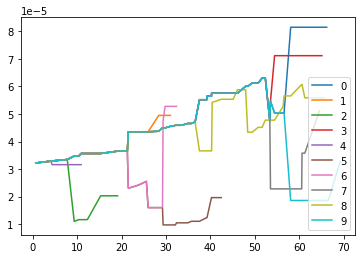

In [9]:
t_df2 = pd.concat(df_list, axis=1).sort_index().fillna(method='backfill',)
t_df2.columns = range(len(t_df2.columns))
t_df2.plot()

* 사용할 지점의 년도별 월평균

In [ ]:
hyd_monitoring_df_filter_site = pd.merge(hyd_gdf.loc[(hyd_gdf.측정시각.dt.year >= 2018) & (hyd_gdf.측정시각.dt.year <= 2020)], hyd_gdf_2, how='left', on=['수계명', '관측소명'])
hyd_monitoring_df_filter_site = hyd_monitoring_df_filter_site.loc[~hyd_monitoring_df_filter_site.geometry_y.isna()]

In [ ]:
hyd_monitoring_df_filter_site.groupby(['관측소명','년도']).count()

In [ ]:
tt = hyd_monitoring_df_filter_site
tt.loc[:,'월'] = tt.측정시각.dt.month

In [ ]:
tt.groupby(['년도','월']).mean()

* plotly

In [22]:
def take_map_df():
    class Rich():
        def __init__ (self, rich_did, lu_rch_did, ru_rch_did, stream_flux, c_area, geometry):
            self.rich_did = rich_did
            self.lu_rch_did = lu_rch_did
            self.ru_rch_did = ru_rch_did
            self.stream_flux = stream_flux               ## 단위 m3/s
            self.c_area = c_area
            self.geometry = geometry
            self.stream_flux_estimated = None
            self.lu_child = None
            self.ru_child = None
            self.stp_family = None
            self.stp_site = False

            self.parent = None

            self.velocity = None                         ## 단위 m/s
            self.velocity_estimated = None
            self.rch_len = None
            self.r_time = None                           ## 단위 hour

            self.PEC_est = None
            self.mass_g = None
        
        def take_lu_child(self,lu_rich_class,):
            self.lu_child = lu_rich_class
            
        def take_ru_child(self,ru_rich_class,):
            self.ru_child = ru_rich_class

        def estimate_flux(self, parents_true_flux, parents_true_carea):
            # ~np.isnan(self.stream_flux_estimated)
            if self.stream_flux is None:
                self.stream_flux_estimated = parents_true_flux *(self.c_area/parents_true_carea)

            elif self.stream_flux is not None:
                print('참값 있음')

    line_gdf_rtime = pickle.load(open(os.path.join(path,"data","lind_gdf_rtime.p",), "rb"))
    line_gdf_rtime.loc[line_gdf_rtime.RCH_DID == '2004170700', 'MB_NM'] = '내성천'
    stp_gdf_info = pickle.load(open(os.path.join(path,"data","stp_gdf_pop.p",), "rb"))
    stp_gdf_info.loc[:,'방류량'] = np.float64(stp_gdf_info.loc[:,'방류량'])

    data_rich = line_gdf_rtime.loc[:,['RCH_DID', 'LU_RCH_DID', 'RU_RCH_DID','CUM_AREA', 'geometry_x']].values
    rich_class_list = []
    for i in range(len(line_gdf_rtime)):
        i_info_rich = data_rich[i]
        rich_class_list.append(Rich(i_info_rich[0],i_info_rich[1],i_info_rich[2],None ,i_info_rich[3],i_info_rich[4]))

    line_gdf_rtime.loc[:,'rich_class'] = rich_class_list

    # 유량	est_flux
    line_gdf_rtime.loc[:,'est_flux'] = line_gdf_rtime.loc[:,'est_flux'] * 86400
    line_gdf_rtime.loc[:,'유량'] = line_gdf_rtime.loc[:,'유량'] * 86400
    for i in range(len(line_gdf_rtime)):
        try:
            line_gdf_rtime.loc[i,'rich_class'].stream_flux_estimated = line_gdf_rtime.loc[i,'est_flux'] 
        except:
            pass
        try:
            line_gdf_rtime.loc[i,'rich_class'].stream_flux = line_gdf_rtime.loc[i,'유량'] 
        except:
            pass

        try:
            line_gdf_rtime.loc[i,'rich_class'].r_time = line_gdf_rtime.loc[i,'r_time']
        except:
            pass
        try:
            line_gdf_rtime.loc[i,'rich_class'].parent = line_gdf_rtime.loc[line_gdf_rtime.RCH_DID == line_gdf_rtime.loc[i,'parent_rch_did'],'rich_class'].values[0]
        except:
            pass

    k = 0.00193 # 반응속도상수 반감기 역수 h-1

    koc = 484800 # 사용자 입력값, L/kg
    Foc_susp = 0.1 # kg_oc*kg_solid-1
    SUSP_water = 4 # mg_solid*L_water-1
    constant_term = koc * Foc_susp * SUSP_water * (10**-6)   # 무차원 상수


    removal_ratio = 0.641 # 물질별로 계산해서 나오는 값 제거율
    base_c = 0.0000044 # 물질별로 나오는 값인것으로 알고있음, 배경농도 g/m3
    e_p = 0.000085 #인당 물질 배출량,  g/(d*명)

    # mass_g

    def cal_mass_down(stp_r, mass_g_out, k_constant):
        if stp_r.parent is not None:
            down_mass = mass_g_out * np.exp(-1*k_constant*stp_r.r_time) #구간 잔존률 * 위에서온 mass

            if stp_r.parent.mass_g is None:
                stp_r.parent.mass_g = down_mass  
            else:
                before_mass = stp_r.parent.mass_g
                stp_r.parent.mass_g = before_mass + down_mass

            cal_mass_down(stp_r.parent, down_mass, k_constant)
        

    # 우선 농도계산은 하지 않고 강줄기별 mass만 계산
    for i in range(len(stp_gdf_info)):
        i_info = stp_gdf_info.loc[i,['Effluent', '인구수', 'RCH_DID']]
        
        population = i_info.인구수
        stp_r = line_gdf_rtime.loc[line_gdf_rtime.RCH_DID == i_info.RCH_DID].rich_class.values[0]
        if stp_r.r_time is not None:
        

            mass_g = (e_p * population)  # g/day   _ 물질 배출량
            mass_g_out = mass_g*(1-removal_ratio)/(1 + constant_term)   # 처리효과 흡착??효과 고려한 물질 out 양


            # 총 물질량 합산 위에서 흘러온것 + stp에서 배출한 것
            try:
                mass_before = stp_r.mass_g
                stp_r.mass_g = mass_before + mass_g_out  # 앞단에서 모든 강줄기에 배경농도는 미리 더해놓음
            except:
                stp_r.mass_g = mass_g_out

            cal_mass_down(stp_r, mass_g_out, k)


    # 0.2보다 크면 방류량 추가 요청
    def parent_flux_est2(i_r,eff):
        
        if (i_r.parent is not None) and (i_r.parent.stream_flux_estimated is not None):
            before_stream = i_r.parent.stream_flux_estimated
            i_r.parent.stream_flux_estimated = before_stream + eff
            
            # if i_r.parent.parent is not None:
            parent_flux_est2(i_r.parent,eff)


    for i in range(len(stp_gdf_info)):
        eff_stp = stp_gdf_info.loc[i,'Effluent']
        rch_did = stp_gdf_info.loc[i,'RCH_DID']

        matched_line = line_gdf_rtime.loc[line_gdf_rtime.RCH_DID == rch_did]
        i_rich = matched_line.rich_class.values[0]
        if i_rich.stream_flux_estimated is not None:
            
            flux = i_rich.stream_flux_estimated
            if eff_stp / flux >= 0.2:
                
                i_rich.stream_flux_estimated = flux + eff_stp
                parent_flux_est2(i_rich,eff_stp)
            else:            
                i_rich = i_rich
                i_rich.stream_flux_estimated = flux



        elif i_rich.stream_flux is not None:
            
            flux = i_rich.stream_flux
            if eff_stp / flux >= 0.2:
                
                i_rich.stream_flux_estimated = flux + eff_stp
                parent_flux_est2(i_rich,eff_stp)
            else:            
                i_rich = i_rich
                i_rich.stream_flux_estimated = flux
        
    for i in range(len(line_gdf_rtime)):
        i_rich = line_gdf_rtime.loc[i,'rich_class']
        
        if np.isnan(i_rich.stream_flux_estimated):
            if ~np.isnan(line_gdf_rtime.loc[i,'유량']):
                i_rich.stream_flux_estimated = line_gdf_rtime.loc[i,'유량']

        

    for i in range(len(line_gdf_rtime)):
        line_gdf_rtime.loc[i,'est_flux'] = line_gdf_rtime.loc[i,'rich_class'].stream_flux_estimated

    # 합천창녕보 리치 중 한곳 바로 위 리치로 유량 교체 요청
    temp_est_flux = line_gdf_rtime.loc[line_gdf_rtime.RCH_DID == '2014060100','est_flux'].values[0]
    line_gdf_rtime.loc[line_gdf_rtime.RCH_DID == '2014040400','est_flux'] = temp_est_flux
    line_gdf_rtime.loc[line_gdf_rtime.RCH_DID == '2014040400','rich_class'].values[0].stream_flux_estimated = temp_est_flux

    # 갑천 유량측정지 본류합류전까지 유량 대체값 조정 요청
    parent_est_flux = line_gdf_rtime.loc[line_gdf_rtime.RCH_DID == '3009061401','est_flux'].values[0]
    parent = line_gdf_rtime.loc[line_gdf_rtime.RCH_DID == '3009061401','rich_class'].values[0].parent
    while True:
        parent.stream_flux_estimated = parent_est_flux
        line_gdf_rtime.loc[line_gdf_rtime.RCH_DID == parent.rich_did,'est_flux'] = parent_est_flux
        if parent.rich_did == '3010010100':
            break
        parent = parent.parent


    # 추정 유량을 통해 농도 환산
    for i in range(len(line_gdf_rtime)):
        i_r = line_gdf_rtime.loc[i,'rich_class']
        if i_r.mass_g is not None:
            
            pec_est = (i_r.mass_g / (line_gdf_rtime.loc[i,'est_flux'])) + base_c

            line_gdf_rtime.loc[i,'rich_class'].PEC_est = pec_est
            line_gdf_rtime.loc[i,'PEC_WS'] = pec_est

    # # 안동댐 수문 하류 농도 배출농도로 일괄처리 요청
    # temp_rch = line_gdf_rtime.loc[line_gdf_rtime.RCH_DID == '2001110900','rich_class'].values[0]
    
    # parent = temp_rch.parent
    # while True:
    #     if parent.rich_did == '2003040300':
    #         break
    #     parent.PEC_est = temp_rch.PEC_est
    #     line_gdf_rtime.loc[line_gdf_rtime.RCH_DID == parent.rich_did, 'PEC_WS'] = temp_rch.PEC_est
    #     parent = parent.parent


        

    line_gdf_rtime.loc[:,'mass'] = [r.mass_g for r in line_gdf_rtime.rich_class.values]
    line_gdf_last = gpd.GeoDataFrame(line_gdf_rtime.loc[~line_gdf_rtime.r_time.isna(),['RCH_DID','MB_NM','RCH_LEN','geometry_x','PEC_WS','r_time','유량','est_flux']], geometry = 'geometry_x')
    line_gdf_last.columns = ['RCH_DID','MB_NM','RCH_LEN','geometry_x','PEC_WS','구간체류시간(h)','유량(m3/day)','추정유량(m3/day)']
    line_gdf_last = line_gdf_last.loc[:,['geometry_x','RCH_DID','MB_NM','RCH_LEN','유량(m3/day)','추정유량(m3/day)','구간체류시간(h)','PEC_WS',]]
    line_gdf_last.index = range(len(line_gdf_last))





    stp_gdf_info_2 = stp_gdf_info.loc[[b in line_gdf_last.RCH_DID.tolist() for b in stp_gdf_info.RCH_DID],['RCH_DID','시설명', '방류량', 'geometry', '인구수']]

    test = pd.merge(stp_gdf_info_2, line_gdf_last, how = 'left', on = 'RCH_DID')
    for i in range(len(test)):
        
        if ~ np.isnan(test.loc[i,'추정유량(m3/day)']):
            d_factor_i = (test.loc[i,'추정유량(m3/day)']) / (test.loc[i,'방류량'])
            if 0< d_factor_i < 1:
                # 희석배율 1미만인지역 1로 맞추고 변경된 추정유량으로 PEC_WS 변경
                test.loc[i,'희석배율'] = 1
                before_est_flux = test.loc[i,'추정유량(m3/day)']
                grad_flux = before_est_flux/test.loc[i,'방류량']
                test.loc[i,'추정유량(m3/day)'] = test.loc[i,'방류량']

                line_gdf_last.loc[line_gdf_last.RCH_DID == test.loc[i,'RCH_DID'],'추정유량(m3/day)'] = test.loc[i,'방류량']

                # line_gdf_rtime.loc[i,'PEC_WS']
                line_gdf_last.loc[line_gdf_last.RCH_DID == test.loc[i,'RCH_DID'],'PEC_WS'] = (line_gdf_last.loc[line_gdf_last.RCH_DID == test.loc[i,'RCH_DID'],'PEC_WS'] - base_c) * grad_flux + base_c
                test.loc[i,'PEC_WS'] = line_gdf_last.loc[line_gdf_last.RCH_DID == test.loc[i,'RCH_DID'],'PEC_WS'].values[0]

            else:
                test.loc[i,'희석배율'] = d_factor_i

            PEC_local_i = (test.loc[i,'인구수'] * e_p * (1-removal_ratio)/(1 + constant_term)) / (test.loc[i,'추정유량(m3/day)'])


        test.loc[i,'C_local'] = (test.loc[i,'인구수'] * e_p * (1-removal_ratio)/(1 + constant_term)) / (test.loc[i,'방류량'])
        test.loc[i,'PEC_local'] = PEC_local_i
        


    remove_ind_list = []
    for i in range(len(line_gdf_last)):
        if line_gdf_last.loc[i,'RCH_DID'] not in set(test.RCH_DID):
            remove_ind_list.append(i)

    line_gdf_last_remove_dup = line_gdf_last.loc[remove_ind_list]
    line_gdf_last_remove_dup.index = range(len(line_gdf_last_remove_dup))

    total_df = pd.concat([test,line_gdf_last_remove_dup])
    total_df.index = range(len(total_df))

    test = test.loc[:,['RCH_DID','시설명','방류량','geometry', '인구수','희석배율','C_local','PEC_local',]]

    bpr_pec = ((10000 * e_p * (1-removal_ratio)/(1 + constant_term)) / 20000) + base_c

    line_gdf_last = gpd.GeoDataFrame(pd.merge(line_gdf_last, line_gdf_rtime.loc[:,['RCH_DID', 'rich_class']], how = 'left', on='RCH_DID'), geometry = 'geometry_x')
    return line_gdf_last, test, total_df, bpr_pec,


In [23]:
from matplotlib.pyplot import legend
import plotly.express as px
import plotly.graph_objects as go


def get_stream_pec_plot(site: str,):

  line_gdf_local, stp_point_gdf_local, _, _ = take_map_df()
  stp_point_gdf2 = gpd.GeoDataFrame(pd.merge(line_gdf.loc[:,['RCH_DID', 'MB_NM']], stp_point_gdf, how = 'right', on='RCH_DID'),geometry = 'geometry')

  xx = site
  rch_list = []
  rch_len_list = []
  stp_list = []

  if xx != '전국':
      mb_gdf = line_gdf_local.loc[line_gdf_local.MB_NM == xx]
      print(mb_gdf.columns.tolist())
  else:
      print('전국 ㄴㄴ')
      return None

  for i in mb_gdf.index.to_list():
      ru_did = mb_gdf.rich_class[i].ru_rch_did
      lu_did = mb_gdf.rich_class[i].lu_rch_did
      
      #ru_rch_did, lu_rch_did, PEC_est
      

      if ru_did is None or ru_did not in mb_gdf.RCH_DID.tolist():
          if lu_did is None or lu_did not in mb_gdf.RCH_DID.tolist():
              rch_list_i = []
              rch_list_i.append(mb_gdf.rich_class[i].PEC_est)

              rch_len_list_i = []
              rch_len_list_i.append(line_gdf_local.loc[line_gdf_local.RCH_DID == mb_gdf.rich_class[i].rich_did].RCH_LEN.values[0])

              stp_list_i = []
              if len(stp_point_gdf_local.loc[stp_point_gdf_local.RCH_DID == mb_gdf.rich_class[i].rich_did, '시설명']) == 1:
                  stp_list_i.append(stp_point_gdf_local.loc[stp_point_gdf_local.RCH_DID == mb_gdf.rich_class[i].rich_did, '시설명'].values[0])
              else:
                  stp_list_i.append(None)

              ######## 이 뒤로 stp_list_i 붙이는 것 수정
              if mb_gdf.rich_class[i].parent is not None:
                  parent = mb_gdf.rich_class[i].parent
                  while True:
                      if parent.rich_did in mb_gdf.RCH_DID.tolist():
                          
                          rch_list_i.append(parent.PEC_est)
                          rch_len_list_i.append(line_gdf_local.loc[line_gdf_local.RCH_DID == parent.rich_did].RCH_LEN.values[0])

                          if len(stp_point_gdf_local.loc[stp_point_gdf_local.RCH_DID == parent.rich_did, '시설명']) == 1:
                              stp_list_i.append(stp_point_gdf_local.loc[stp_point_gdf_local.RCH_DID == parent.rich_did, '시설명'].values[0])
                          else:
                              stp_list_i.append(None)


                          if parent.parent is not None:
                              parent = parent.parent
                          else:
                              rch_len_list.append(rch_len_list_i)
                              rch_list.append(rch_list_i)
                              stp_list.append(stp_list_i)
                              break
                      else:
                          rch_len_list.append(rch_len_list_i)
                          rch_list.append(rch_list_i)
                          stp_list.append(stp_list_i)
                          break
                  

  for i in range(len(rch_len_list)):
      tem_list = deepcopy(rch_len_list[i])
      tem_list.reverse()
      tem_list = np.cumsum(tem_list).tolist()
      tem_list.reverse()
      rch_len_list[i] = tem_list

  df_list = []
  for i in range(len(rch_len_list)):
      t_df = pd.DataFrame(np.reshape(rch_list[i],(-1,1)), index=rch_len_list[i])
      df_list.append(t_df)

  df_list_stp = []
  for i in range(len(stp_list)):
      t_df = pd.DataFrame(np.reshape(stp_list[i],(-1,1)), index=rch_len_list[i])
      df_list_stp.append(t_df)
  stp_df = pd.concat(df_list_stp, axis=1).sort_index()
  stp_info_list_by_clen = []
  for i in range( len(stp_df)):
      stp_info_list_by_clen_i = []
      for i in list(set(stp_df.iloc[i].values)):
          if type(i) == str:
              stp_info_list_by_clen_i.append(i)
      if len(stp_info_list_by_clen_i) == 0:
          stp_info_list_by_clen_i.append(None)
      stp_info_list_by_clen.extend(stp_info_list_by_clen_i)
              
  stp_df.loc[:,'stp_name'] = stp_info_list_by_clen
  stp_df.loc[:,'len'] = stp_df.index.tolist()
  stp_df.index = range(len(stp_df))
  stp_df = stp_df.loc[:,['stp_name', 'len']]


  df_list_2 = []
  for i in range(len(df_list)):
      t_df = deepcopy(df_list[i])
      t_df.loc[:,'len'] = t_df.index.tolist()
      t_df.rename(columns = {0:'PEC_ws',},inplace=True)
      t_df.index = range(len(t_df))
      t_df.loc[:,'rch'] = i
      df_list_2.append(t_df)

  t_df3 = pd.concat(df_list_2, axis=0)

  df_by_lenindex = pd.DataFrame(list(set(t_df3.len)), columns=['len']) # 듬성듬성하지만 빠름
  for i in range(len(df_list_2)):
      t_df = deepcopy(df_list_2[i])
      filled_df = pd.merge(df_by_lenindex, t_df, how='left', on = 'len').sort_values('len').fillna(method='backfill')
      df_list_2[i] = filled_df.dropna()

  filled_pec_line_df = pd.concat(df_list_2, axis=0)
  stp_df = pd.merge(stp_df.dropna(),t_df3.loc[:,['PEC_ws', 'len']], how='left', on = 'len').drop_duplicates()
  stp_df.index = range(len(stp_df))

  color_discrete_map = {}
  for i in list(set(filled_pec_line_df.rch)):
    color_discrete_map[i] = 'rgb(0,0,150)'



  fig = px.line(filled_pec_line_df, 
                x='len', # x축
                y='PEC_ws',  # y축
                color='rch',
                title=f'PEC_ws({xx})', # Title 
                color_discrete_map=color_discrete_map,
                )
  # fig.update_layout(showlegend=False)

  color_list = [
          'rgba(255, 51, 51, .9)',
          'rgba(255, 122, 51, .9)',
          'rgba(255, 221, 51, .9)',
          'rgba(168, 255, 51, .9)',
          'rgba(51, 255, 209, .9)',
          'rgba(51, 110, 255, .9)',
          'rgba(212, 51, 255, .9)',
          'rgba(255, 51, 131, .9)',
          'rgba(183, 142, 158, .9)',
          'rgba(131, 45, 79, .9)',
          'rgba(49,   182, 100, .9)',
          'rgba(180, 80, 40, .9)',
          'rgba(30, 123, 97, .9)',
          'rgba(190, 51, 233, .9)',
          'rgba(240, 35, 211, .9)',
          'rgba(100, 87, 193, .9)',
          'rgba(30, 179, 142, .9)',
          'rgba(130, 98, 111, .9)',
          'rgba(170, 12, 193, .9)',
  ]

  for i in range(len(stp_df)):
      i_color = color_list[i]
      stp_point = go.Scatter(x=stp_df.loc[i,['len']],
                                  y=stp_df.loc[i,['PEC_ws']],
                                  mode="markers",
                                  # line=go.scatter.Line(color="gray"),
                                  marker={'size':10},
                                  marker_color=i_color,
                                  legendgroup="STP point",
                                  legendgrouptitle_text="STP point",
                                  name=stp_df.loc[i,['stp_name']].values[0],
                                  showlegend=True
                                  )
      # print(stp_df.loc[i,['stp_name']].values[0])

      fig.add_trace(stp_point)
  return fig
  

In [24]:
xx = '안성천'
stream_chart = get_stream_pec_plot(xx)
stream_chart.show()



['geometry_x', 'RCH_DID', 'MB_NM', 'RCH_LEN', '유량(m3/day)', '추정유량(m3/day)', '구간체류시간(h)', 'PEC_WS', 'rich_class']
